In [1]:
# Core
import re, os, sys, string, random, pickle
import pandas as pd
from pathlib import Path
import numpy as np
# Plotting
%matplotlib inline
%config InlineBackend.figure_format ='retina'
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from matplotlib.ticker import MultipleLocator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib import colors, colorbar, rcParams
from matplotlib import gridspec
rcParams['pdf.fonttype'] = 42
rcParams['font.sans-serif'] = "Arial"
rcParams['font.family'] = "sans-serif"
# Networks and data stuff
import networkx as nx
from sklearn.preprocessing import StandardScaler
from helpers import flatten, remove_singletons, lighten_color

Some portions of this notebook require simultaneous or previous analyses using the _P. oleracea_ data in the `PO_network-plotting.ipynb` notebook.

In [2]:
wwAdj = pd.read_csv("../Network-analysis/Well-watered-subadj.csv", index_col=0)
wwAdj = wwAdj.loc[wwAdj.columns]
dAdj = pd.read_csv("../Network-analysis/Drought-subadj.csv", index_col=0)
dAdj = dAdj.loc[dAdj.columns]
pathways = pd.read_csv("../InDepth-Annotation-Pipeline/P-amilis-pathway-assignments.csv", index_col=0)
pathways = pathways.reset_index()
wwAdj.head()

,FUN_011473,FUN_026031,FUN_046898,FUN_048323,FUN_013066,FUN_023069,FUN_026803,FUN_032432,FUN_003986,FUN_036354,...,FUN_041054,FUN_041791,FUN_049767,FUN_049818,FUN_049819,FUN_050612,FUN_050746,FUN_050845,FUN_052554,FUN_047817
FUN_011473,1.000000,0.000151,0.001862,0.000830,0.000023,0.000019,1.060633e-03,0.000030,0.000029,0.006239,...,2.301343e-01,0.036442,0.014751,0.001325,0.004555,0.034868,0.039608,0.001826,0.000015,0.001462
FUN_026031,0.000151,1.000000,0.254023,0.790805,0.000364,0.000281,1.144949e-07,0.000842,0.008044,0.000843,...,2.125668e-03,0.061979,0.027571,0.003962,0.008209,0.000001,0.051282,0.598860,0.113515,0.001730
FUN_046898,0.001862,0.254023,1.000000,0.156044,0.000124,0.000129,1.825771e-06,0.000154,0.005237,0.001257,...,3.382838e-03,0.028997,0.051988,0.001716,0.001543,0.000016,0.015460,0.101973,0.059574,0.001042
FUN_048323,0.000830,0.790805,0.156044,1.000000,0.000072,0.000089,1.926453e-08,0.000244,0.002758,0.001147,...,5.548109e-03,0.140647,0.043186,0.007977,0.021127,0.000003,0.116448,0.833984,0.086439,0.002258
FUN_013066,0.000023,0.000364,0.000124,0.000072,1.000000,0.752685,3.361558e-01,0.873096,0.044827,0.076368,...,8.066563e-07,0.000072,0.000005,0.039151,0.025771,0.002867,0.000020,0.000034,0.021426,0.229588


In [3]:
sleuthDE = pd.read_csv("../Abundance-analysis/sleuth/P-amilis-sleuth-DEgenes.csv")
wwExpressed = list(set(sleuthDE.target_id).intersection(set(wwAdj.columns)))
dExpressed = list(set(sleuthDE.target_id).intersection(set(dAdj.columns)))

pathways = pathways.merge(sleuthDE[["target_id", "qval"]], left_on="genemodel", right_on="target_id").drop(labels=["target_id"], axis=1)
wwAdj = wwAdj.loc[wwExpressed][wwExpressed]
dAdj = dAdj.loc[dExpressed][dExpressed]

print(wwAdj.shape, dAdj.shape, pathways.shape)

(416, 416) (417, 417) (417, 10)


In [4]:
wwModAssgn = pd.read_csv("../Network-analysis/WGCNA/Well-watered-module-labels.genes.csv", names=["genemodel", "WGCNA_ww"], skiprows=[0])
dModAssgn = pd.read_csv("../Network-analysis/WGCNA/Drought-module-labels.genes.csv", names=["genemodel", "WGCNA_d"], skiprows=[0])
wwModAssgn = wwModAssgn.merge(dModAssgn, on="genemodel", how="outer")
pathways = pathways.merge(wwModAssgn, on="genemodel", how="inner")
pathways = pathways.drop(labels=["Notes", 'Orthogroup'], axis=1)
pathways

,Arabidopsis ortholog,genemodel,Uniprot,Gene-family,Block-description,Pathway,Localization,qval,WGCNA_ww,WGCNA_d
0,"AT5G50370, AT5G63400",FUN_011473,ADK3-2,ADK,Adenylate kinase 3,PEP generation,chloroplast,0.026105,2.0,13.0
1,AT5G35170,FUN_026031,ADK5-1,ADK,Adenylate kinase 5,PEP generation,chloroplast,0.000181,3.0,2.0
2,"AT5G50370, AT5G63400",FUN_046898,ADK3-1,ADK,Adenylate kinase 3,PEP generation,chloroplast,0.154056,1.0,6.0
3,AT5G47840,FUN_048323,ADK2-1,ADK,Adenylate kinase 2,PEP generation,chloroplast,0.152209,3.0,5.0
4,"AT2G18915,AT5G57360",FUN_013066,ADO1-1,ADO/ZTL,Adagio/Zeitlupe 1,Light response,NaN,0.049064,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...
412,"AT2G21410, AT4G39080",FUN_050612,VHA-a2-3,VHA,V-type proton ATPase catalytic subunit a2,Proton transport,vacuole,0.026534,2.0,13.0
413,"AT4G38920, AT1G19910, AT2G16510, AT4G34720",FUN_050746,VHA-c-4,VHA,V-type proton ATPase catalytic subunit c,Proton transport,vacuole,0.023234,1.0,5.0
414,AT4G02620,FUN_050845,VHA-F-1,VHA,V-type proton ATPase catalytic subunit F,Proton transport,vacuole,0.000002,1.0,8.0
415,AT3G42050,FUN_052554,VHA-H-2,VHA,V-type proton ATPase catalytic subunit H,Proton transport,vacuole,0.000013,3.0,5.0


Because so many TFs have dual roles are are intimately involved in both light responses and circadian functions, I'm going to merge them.

In [5]:
to_replace = ["Circadian rhythm", "Circadian rhythm/Light response", "Light response"]
pathways["Pathway"] = [p if p not in to_replace else "Circadian/Light response" for p in pathways.Pathway.values]

In [6]:
# pathways.to_csv("../Network-analysis/P-amilis-pathways-modules.csv", index=False)
pathways = pd.read_csv("../Network-analysis/P-amilis-pathways-modules.csv")

In [7]:
prefix_dict = {"chloroplast":"cp", "cytoplasm":"cy", "mitochondria":"mt", "peroxisome":"p", "vacuole":"va", "unknown":"", "ubiquitous":"", "nucleus":"nu"}
local_uniprots = []
for i,row in pathways.iterrows():
    try:
        prefix = prefix_dict[row["Localization"]]
    except KeyError:
        prefix = ""
    if str(row["Uniprot"]).startswith(prefix):
        local_uniprots.append(row["Uniprot"])
    else:
        local_uniprots.append(prefix+row["Uniprot"])
pathways["local_uniprot"] = local_uniprots

Cut edges with adjacency less than 0.25.

In [8]:
thresh = 0.25
wwAdjThresh = wwAdj.copy()
wwAdjThresh[wwAdj < thresh] = 0
wwAdjThresh

,FUN_052255,FUN_034039,FUN_013944,FUN_015589,FUN_032219,FUN_052690,FUN_052540,FUN_025361,FUN_002684,FUN_008415,...,FUN_024331,FUN_046971,FUN_003773,FUN_030103,FUN_051857,FUN_041647,FUN_046977,FUN_017357,FUN_037299,FUN_043773
FUN_052255,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.000000,0.0,0.383181,0.000000,0.000000,0.0,0.000000
FUN_034039,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.293765,...,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.450865,0.513042,0.0,0.611075
FUN_013944,0.000000,0.000000,1.000000,0.000000,0.271007,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.377555,0.0,0.000000,0.000000,0.000000,0.0,0.000000
FUN_015589,0.000000,0.000000,0.000000,1.000000,0.780582,0.0,0.457787,0.0,0.0,0.000000,...,0.0,0.495781,0.0,0.424730,0.0,0.000000,0.000000,0.000000,0.0,0.273748
FUN_032219,0.000000,0.000000,0.271007,0.780582,1.000000,0.0,0.331597,0.0,0.0,0.000000,...,0.0,0.511173,0.0,0.659610,0.0,0.000000,0.000000,0.000000,0.0,0.369335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FUN_041647,0.383181,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.000000,0.0,1.000000,0.000000,0.000000,0.0,0.000000
FUN_046977,0.000000,0.450865,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.360794,0.0,0.000000,1.000000,0.000000,0.0,0.404535
FUN_017357,0.000000,0.513042,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.332023,...,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,1.000000,0.0,0.256900
FUN_037299,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,1.0,0.000000


In [9]:
dAdjThresh = dAdj.copy()
dAdjThresh[dAdj < thresh] = 0
dAdjThresh

,FUN_052255,FUN_034039,FUN_013944,FUN_015589,FUN_032219,FUN_052690,FUN_052540,FUN_025361,FUN_002684,FUN_008415,...,FUN_024331,FUN_046971,FUN_003773,FUN_030103,FUN_051857,FUN_041647,FUN_046977,FUN_017357,FUN_037299,FUN_043773
FUN_052255,1.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
FUN_034039,0.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.303199,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
FUN_013944,0.0,0.0,1.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.343117,0.000000,0.273601,0.0,0.0,0.000000,0.0,0.000000,0.000000
FUN_015589,0.0,0.0,0.0,1.000000,0.502356,0.0,0.616091,0.0,0.0,0.0,...,0.0,0.272712,0.289124,0.291758,0.0,0.0,0.475490,0.0,0.328461,0.485506
FUN_032219,0.0,0.0,0.0,0.502356,1.000000,0.0,0.384514,0.0,0.0,0.0,...,0.0,0.321710,0.000000,0.525528,0.0,0.0,0.251035,0.0,0.338496,0.307160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FUN_041647,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,1.0,0.000000,0.0,0.000000,0.000000
FUN_046977,0.0,0.0,0.0,0.475490,0.251035,0.0,0.327453,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,1.000000,0.0,0.000000,0.000000
FUN_017357,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.0,0.000000,0.000000
FUN_037299,0.0,0.0,0.0,0.328461,0.338496,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.494419,0.000000,0.374817,0.0,0.0,0.000000,0.0,1.000000,0.000000


Create adjacency networks and remove singletons.

In [10]:
wwG = nx.from_pandas_adjacency(wwAdjThresh)
wwG.remove_edges_from(nx.selfloop_edges(wwG))
wwG = remove_singletons(wwG)
wwNodes = wwG.nodes
ww_degreedict = dict(wwG.degree(wwNodes))
pathways["wwDegree"] = [ww_degreedict[g] if g in ww_degreedict.keys() else None for g in pathways["genemodel"]]
nx.set_node_attributes(wwG, ww_degreedict, 'degree')

dG = nx.from_pandas_adjacency(dAdjThresh)
dG.remove_edges_from(nx.selfloop_edges(dG))
dG = remove_singletons(dG)
dNodes = dG.nodes
d_degreedict = dict(dG.degree(dNodes))
pathways["dDegree"] = [d_degreedict[g] if g in d_degreedict.keys() else None for g in pathways["genemodel"]]
nx.set_node_attributes(dG, d_degreedict, 'degree')

Print a few stats.

In [11]:
print(nx.info(wwG))
print("Density: {}".format(nx.density(wwG)))
print(nx.info(dG))
print("Density: {}".format(nx.density(dG)))

Name: 
Type: Graph
Number of nodes: 387
Number of edges: 10103
Average degree:  52.2119
Density: 0.1352639541577968
Name: 
Type: Graph
Number of nodes: 405
Number of edges: 9620
Average degree:  47.5062
Density: 0.11758953673145092


In [12]:
print(np.median(list(ww_degreedict.values())))
print(np.median(list(d_degreedict.values())))

34.0
46.0


Let's save these graphs.

In [13]:
pickle.dump(wwG, open("../Network-analysis/P-amilis-WW-PGN.txt", 'wb'))
pickle.dump(dG, open("../Network-analysis/P-amilis-D-PGN.txt", 'wb'))

In [14]:
colormap = {'Starch degradation':"xkcd:dark red", 
            'Starch/sugar transport':"xkcd:golden rod", 
            'Starch synthesis':"xkcd:pastel red",
            'Transitory starch pathway':'xkcd:bright red',
            
            'PEP generation':"xkcd:bright lavender",
            'PEPC regulation':"xkcd:windows blue",
            'Carboxylation':"xkcd:bright green",
            'Aminotransferase':"xkcd:kermit green",
            'Decarboxylation':"xkcd:murky green",
            
            'Photorespiration':"xkcd:putty",
            'Calvin cycle':"xkcd:bright turquoise",
            
            'Metabolite transport':"xkcd:pink",
            'Proton transport':"xkcd:shocking pink",  
            "Circadian/Light response":"xkcd:sunshine yellow"}

pathways["pathway_color"] = [colormap[p] for p in pathways["Pathway"]]

Let's plot these networks. First the well-watered.

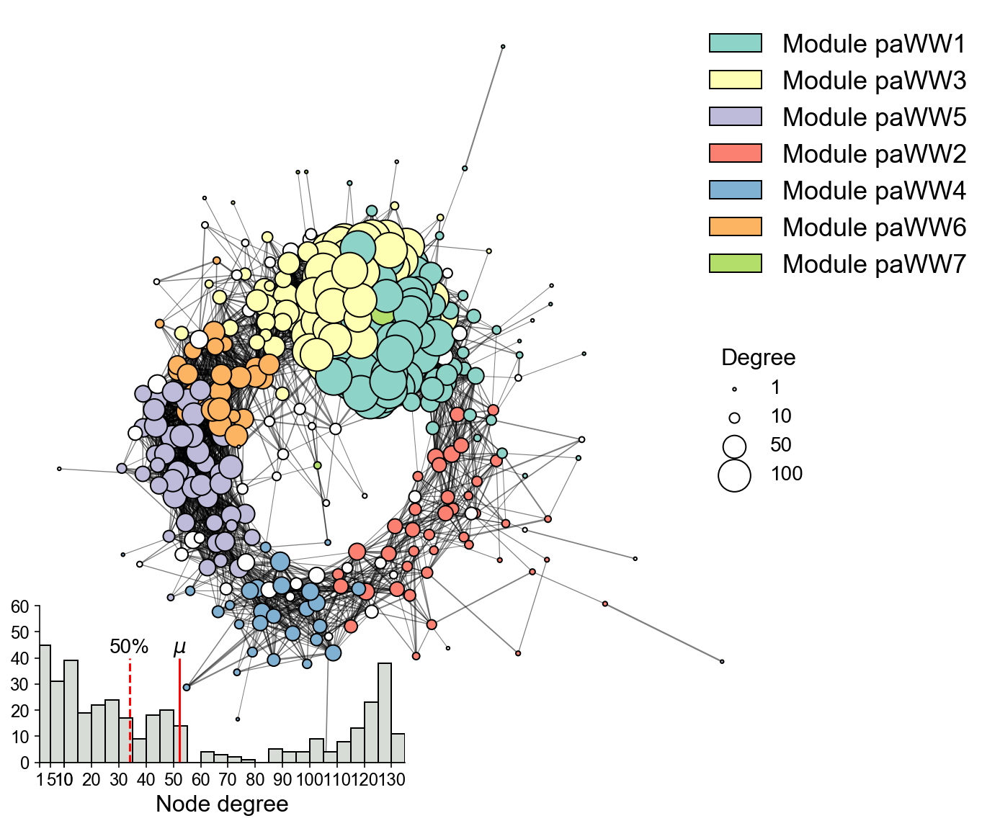

In [15]:
fig = plt.figure(figsize=(12,10))
gs = gridspec.GridSpec(1, 2, width_ratios=[5, 1]) 
ax = plt.subplot(gs[0])
ax_leg = plt.subplot(gs[1])
pos = nx.kamada_kawai_layout(wwG)

WGCNA_ww_cmap = {}
for idx, (i,v) in enumerate(pathways["WGCNA_ww"].value_counts().items()):
    if idx == 8: idx+=1
    if v>=10:
        color = plt.cm.Set3(idx)
    else:
        color = "xkcd:white"
    WGCNA_ww_cmap[i] = color
    
nodecolors = [WGCNA_ww_cmap[pathways[pathways["genemodel"]==n]["WGCNA_ww"].values[0]] for n in wwNodes]

ec = nx.draw_networkx_edges(wwG, pos, alpha=0.5, width=[wwG[u][v]['weight']*2 for u,v in wwG.edges()], ax=ax)
nc = nx.draw_networkx_nodes(wwG, pos, nodelist = wwNodes, node_size=[v * 5 for v in ww_degreedict.values()], node_color = nodecolors, ax=ax)
nc.set_edgecolor('black')

# Module color legend
handles = []
for i, (k,v) in enumerate(WGCNA_ww_cmap.items()):
    if v == "xkcd:white": continue
    handles.append(mpatches.Patch(color=v, label="Module paWW{}".format(int(k)), ec="black"))
ax_leg.legend(handles=handles, loc="upper right", frameon=False, fontsize=18, ncol=1)

# Point size legend
axpsl = inset_axes(ax, width="100%", height="100%", bbox_to_anchor=(0.1, 0.3, 1, 0.3), bbox_transform=ax.transAxes)
axpsl.patch.set_facecolor("None")
l1 = axpsl.scatter([],[], s=5*1, c="white", edgecolors='black', label="1")
l2 = axpsl.scatter([],[], s=5*10, c="white", edgecolors='black', label="10")
l3 = axpsl.scatter([],[], s=5*50, c="white", edgecolors='black', label="50")
l4 = axpsl.scatter([],[], s=5*100, c="white", edgecolors='black', label="100")
axpsl.legend(title="Degree", fontsize="14", frameon=False, title_fontsize=16)
axpsl.axis("off")

# Add inset
axins = inset_axes(ax_leg, width="100%", height="100%", bbox_to_anchor=(0.01, 0.03, 0.5, 0.2), bbox_transform=ax.transAxes, loc=3)
axins.patch.set_facecolor("None")
axins.hist(ww_degreedict.values(), bins=flatten([[0,1,5,10], np.arange(10,165,5)]), color="xkcd:light gray", edgecolor="black")
axins.vlines(x=pathways["wwDegree"].mean(), ymin=0, ymax=40, color='red', linestyles="-")
axins.vlines(x=pathways["wwDegree"].describe()["50%"], ymin=0, ymax=40, color='red', linestyles="--")
axins.text(s="$\mu$", x=pathways["wwDegree"].mean(), y=40*1.05, ha='center', size=14)
axins.text(s="50%", x=pathways["wwDegree"].describe()["50%"], y=40*1.05, ha='center', size=14)

axins.set_xticks(np.concatenate([[1,5,10], np.arange(10,160,10)]))
axins.set_xticklabels(np.concatenate([[1,5,10], np.arange(10,160,10)]), size=12)
axins.set_yticks(np.arange(0,90,10))
axins.set_yticklabels(np.arange(0,90,10), size=12)
axins.set_xlabel("Node degree", size=16)

# Hide the right and top spines
axins.spines['right'].set_visible(False)
axins.spines['top'].set_visible(False)
axins.set_xlim(1,135)
axins.set_ylim(0,60)

ax.axis('off')
ax_leg.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-well-watered-PGN.pdf", transparent=True, bbox_to_inches="tight", dpi=300)

And the drought network.

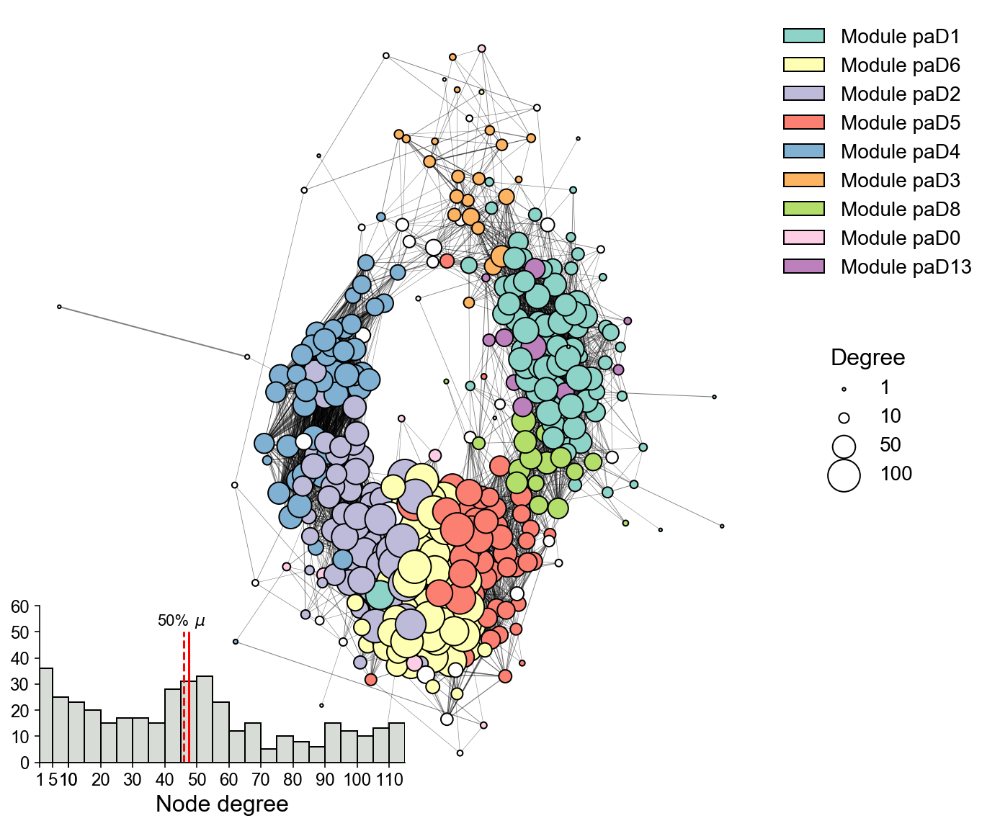

In [16]:
fig = plt.figure(figsize=(12,10))
gs = gridspec.GridSpec(1, 2, width_ratios=[5, 1]) 
ax = plt.subplot(gs[0])
ax_leg = plt.subplot(gs[1])

pos = nx.kamada_kawai_layout(dG)

WGCNA_d_cmap = {}
for idx, (i,v) in enumerate(pathways["WGCNA_d"].value_counts().items()):
    if idx == 8: idx+=1
    if v>=10:
        color = plt.cm.Set3(idx)
    else:
        color = "xkcd:white"
    WGCNA_d_cmap[i] = color

nodecolors = [WGCNA_d_cmap[pathways[pathways["genemodel"]==n]["WGCNA_d"].values[0]] for n in dNodes]
ec = nx.draw_networkx_edges(dG, pos, alpha=0.5, width=[dG[u][v]['weight'] for u,v in dG.edges()], ax=ax)
nc = nx.draw_networkx_nodes(dG, pos, nodelist = dNodes, node_size=[v * 5 for v in d_degreedict.values()], node_color = nodecolors, ax=ax)
nc.set_edgecolor('black')

handles = []
for i, (k,v) in enumerate(WGCNA_d_cmap.items()):
    if v == "xkcd:white": continue
    handles.append(mpatches.Patch(color=v, label="Module paD{}".format(int(k)), ec="black"))
ax_leg.legend(handles=handles, loc="upper right", frameon=False, fontsize=14, ncol=1)

# Point size legend
axpsl = inset_axes(ax, width="100%", height="100%", bbox_to_anchor=(0.25, 0.3, 1, 0.3), bbox_transform=ax.transAxes)
axpsl.patch.set_facecolor("None")
l1 = axpsl.scatter([],[], s=5*1, c="white", edgecolors='black', label="1")
l2 = axpsl.scatter([],[], s=5*10, c="white", edgecolors='black', label="10")
l3 = axpsl.scatter([],[], s=5*50, c="white", edgecolors='black', label="50")
l4 = axpsl.scatter([],[], s=5*100, c="white", edgecolors='black', label="100")
axpsl.legend(title="Degree", fontsize="14", frameon=False, title_fontsize=16)
axpsl.axis("off")

# Add inset
axins = inset_axes(ax, width="100%", height="100%", bbox_to_anchor=(0.01, 0.03, 0.5, 0.2), bbox_transform=ax.transAxes, loc=3)
axins.patch.set_facecolor("None")
axins.hist(d_degreedict.values(), bins=flatten([[0,1,5,10], np.arange(10,125,5)]), color="xkcd:light gray", edgecolor="black")
axins.vlines(x=pathways["dDegree"].mean(), ymin=0, ymax=50, color='red', linestyles="-")
axins.vlines(x=pathways["dDegree"].describe()["50%"], ymin=0, ymax=50, color='red', linestyles="--")
axins.text(s="$\mu$", x=pathways["dDegree"].mean()*1.075, y=52.5, ha='center', size=11)
axins.text(s="50%", x=pathways["dDegree"].describe()["50%"]*0.925, y=52.5, ha='center', size=11)

axins.set_xticks(np.concatenate([[1,5,10], np.arange(10,125,10)]))
axins.set_xticklabels(np.concatenate([[1,5,10], np.arange(10,125,10)]), size=12)
axins.set_yticks(np.arange(0,130,10))
axins.set_yticklabels(np.arange(0,130,10), size=12)
axins.set_xlabel("Node degree", size=16)
# Hide the right and top spines
axins.spines['right'].set_visible(False)
axins.spines['top'].set_visible(False)
axins.set_xlim(1,115)
axins.set_ylim(0,60)

ax.axis('off')
ax_leg.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-drought-PGN.pdf", transparent=True, bbox_to_inches="tight", dpi=300)

Now I'll plot a few descriptive stats for the supplement that show the distribution of all module sizes (regardless of whether they are contained in the PGNs) and the node degree histograms that are in the PGNs, above.

/Users/iangilman/miniconda3/envs/python3/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  app.launch_new_instance()


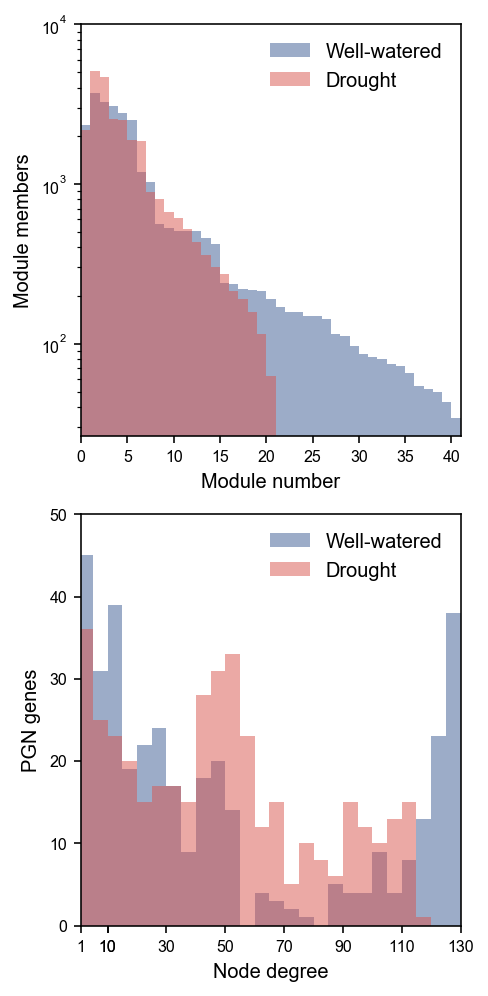

In [17]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(3.5, 7))

bins = np.arange(0,np.max(wwModAssgn[["WGCNA_ww", "WGCNA_d"]].max().values)+2,1)
ax[0].hist(wwModAssgn["WGCNA_ww"], bins=bins, color = "xkcd:denim blue", alpha=0.5, label="Well-watered")
ax[0].hist(wwModAssgn['WGCNA_d'], bins=bins, color = "xkcd:pale red", alpha=0.5, label = "Drought")
ax[0].legend(frameon=False, fontsize=10)

ax[0].set_xticks(np.arange(0, bins[-1]+1, 5))
ax[0].set_xticklabels(["{}".format(int(t)) for t in np.arange(0, bins[-1]+1, 5)], size=8)
ax[0].set_yticks(np.arange(0, 12000, 1000))
ax[0].set_yticklabels(np.arange(0, 12000, 1000), size=8)
ax[0].set_xlim(0,41)
ax[0].set_xlabel("Module number", size=10)
ax[0].set_ylabel("Module members", size=10)
ax[0].semilogy()
ax[0].set_ylim(0,10000)
        
# Add inset
bins=flatten([[0,1,5,10], np.arange(10,165,5)])
ax[1].hist(ww_degreedict.values(), bins=bins, color = "xkcd:denim blue", alpha=0.5, label="Well-watered")
ax[1].hist(d_degreedict.values(), bins=bins, color = "xkcd:pale red", alpha=0.5, label="Drought")
ax[1].legend(frameon=False, fontsize=10)

ax[1].set_xticks(np.concatenate([[1,10], np.arange(10,160,20)]))
ax[1].set_xticklabels(np.concatenate([[1,10], np.arange(10,160,20)]), size=8)
ax[1].set_yticks(np.arange(0,90,10))
ax[1].set_yticklabels(np.arange(0,90,10), size=8)
ax[1].set_xlabel("Node degree", size=10)
ax[1].set_ylabel("PGN genes", size=10)
ax[1].set_xlim(1,130)
ax[1].set_ylim(0,50)

plt.tight_layout()
# plt.savefig("../Figures/Network-Analysis/P-amilis-FigureS1.pdf", transparent=True, bbox_to_inches="tight", dpi=300)

We can see that the size distributions are pretty similar, but that the well-watered network has many more small modules. The genes in the well-watered PGN have a more bimodal distribution, with some very highly connected nodes.

Now I'll see what our C4 and CAM genes are doing across the modules. I'll find the preserved and exclusive genes to each network. I'll consider paWW1+paWW3 and paD6+paD5 to be the main C4 modules, and paWW5 and paD4 to be the nocturnal CAM modules. I understand that there may be alternative boundaries, but these do largely contain the C4 genes, which form a very tightly and highly connnected subnetwork. And on the CAM side, these modules contain _PPC-1E1c_, while the other modules with high nocturnal expression are not highly connected to them.

In [18]:
aprime_watered = set(pathways[pathways["WGCNA_ww"]==1.0]["genemodel"].values)
aprime_drought = set(pathways[pathways["WGCNA_d"]==6.0]["genemodel"].values)
C4_watered = set(pathways[pathways["WGCNA_ww"].isin([1,3])].genemodel.values)
C4_drought = set(pathways[pathways["WGCNA_d"].isin([5,6])].genemodel.values)
c_watered = set(pathways[pathways["WGCNA_ww"]==5.0]["genemodel"].values)
c_drought = set(pathways[pathways["WGCNA_d"]==4.0]["genemodel"].values)

/Users/iangilman/miniconda3/envs/python3/lib/python3.7/site-packages/ipykernel_launcher.py:79: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


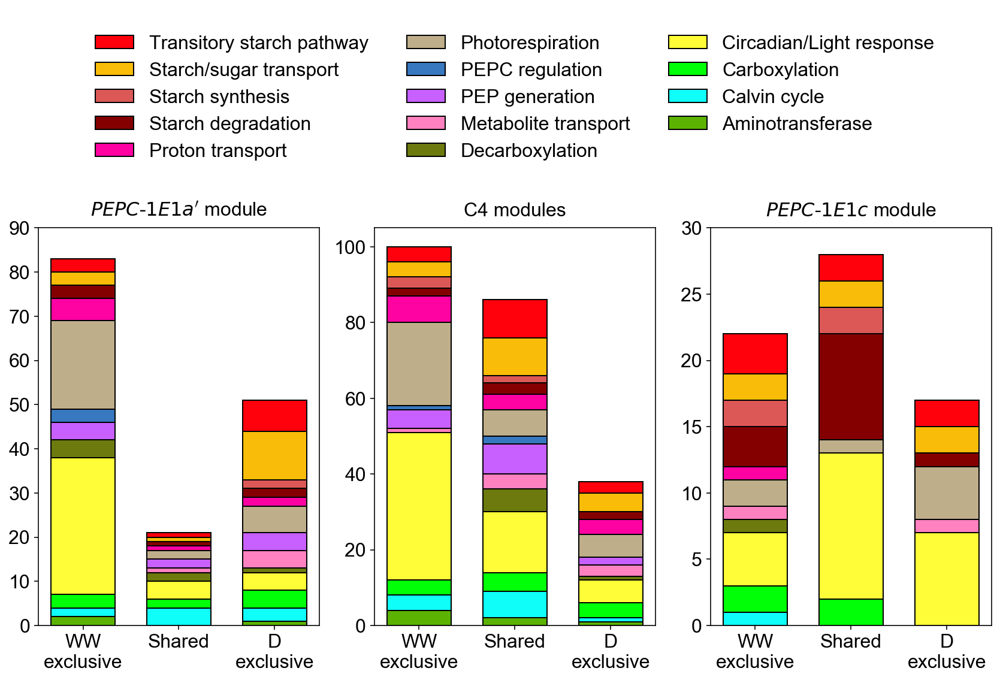

In [19]:
fig = plt.figure(constrained_layout=True, figsize=(12,8))
gs = fig.add_gridspec(3, 3)
leg_ax = fig.add_subplot(gs[0,:])
axL = fig.add_subplot(gs[1:,0])
axC = fig.add_subplot(gs[1:,1])
axR = fig.add_subplot(gs[1:,2])

# Left
purple_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(aprime_watered, aprime_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axL.bar(x=0, height=v, bottom=purple_bottom, color = colormap[k], edgecolor="black", width=0.5)
    purple_bottom+=v

purple_blue_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.intersection(aprime_watered, aprime_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axL.bar(x=0.75, height=v, bottom=purple_blue_bottom, color = colormap[k], edgecolor="black", width=0.5)
    purple_blue_bottom+=v
    
blue_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(aprime_drought, aprime_watered)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axL.bar(x=1.5, height=v, bottom=blue_bottom, color = colormap[k], edgecolor="black", width=0.5)
    blue_bottom+=v

# Center
purple_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(C4_watered, C4_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axC.bar(x=0, height=v, bottom=purple_bottom, color = colormap[k], edgecolor="black", width=0.5)
    purple_bottom+=v

purple_blue_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.intersection(C4_watered, C4_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axC.bar(x=0.75, height=v, bottom=purple_blue_bottom, color = colormap[k], edgecolor="black", width=0.5)
    purple_blue_bottom+=v
    
blue_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(C4_drought, C4_watered)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axC.bar(x=1.5, height=v, bottom=blue_bottom, color = colormap[k], edgecolor="black", width=0.5)
    blue_bottom+=v

# Right
green_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(c_watered, c_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0, height=v, bottom=green_bottom, color = colormap[k], edgecolor="black", width=0.5)
    green_bottom+=v

green_yellow_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.intersection(c_watered, c_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0.75, height=v, bottom=green_yellow_bottom, color = colormap[k], edgecolor="black", width=0.5)
    green_yellow_bottom+=v
    
yellow_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(c_drought, c_watered)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=1.5, height=v, bottom=yellow_bottom, color = colormap[k], edgecolor="black", width=0.5)
    yellow_bottom+=v
    
handles = []
for i, (k,v) in enumerate(sorted(colormap.items(), reverse=True)):
    if k == "Circadian rhythm/Light response": k = "Circadian rhythm/\nLight response"
    handles.append(mpatches.Patch(color=v, label=k, ec="black"))
leg_ax.legend(handles=handles, loc="center", frameon=False, fontsize=16, ncol=3)
leg_ax.axis("off")

for ax in [axL, axC, axR]:
    ax.set_xticks([0,0.75,1.5])
    ax.set_xticklabels(["WW\nexclusive", "Shared", "D\nexclusive"], rotation=0, size=16)

axL.set_yticks(np.arange(0,100,10))
axL.set_yticklabels(np.arange(0,100,10), size=16)
axC.set_yticks(np.arange(0,120,20))
axC.set_yticklabels(np.arange(0,120,20), size=16)
axR.set_yticks(np.arange(0,35,5))
axR.set_yticklabels(np.arange(0,35,5), size=16)

axL.set_title("$PEPC$-$1E1a'$ module", size=16, pad=10)
axC.set_title("C4 modules", size=16, pad=10)
axR.set_title("$PEPC$-$1E1c$ module", size=16, pad=10)
# ax[1].axis("off")

plt.tight_layout()
# plt.savefig("../Figures/Network-Analysis/P-amilis-PEPC-module-intersections.pdf", bbox_to_inches="tight", dpi=300)

We can see that the _PPC-1E1a'_ module was not well preserved, but the C4 module is. The _PPC-1E1c_ module is very highly preserved. Let's see what somme of these look like. Specifically it would be interesting to see

- The drought-exclusive C4 network, which may reflect the diurnal, induced portion of the CAM cycle
- Drought CAM networks

Unfortunately, we cannot look at the preserved networks because without choosing a network to explore them in. We could find the maximum common subgraph between them, but this probelm is NP-hard for undirected graphs.

I'll plot the same data above in smaller format for the paper below.

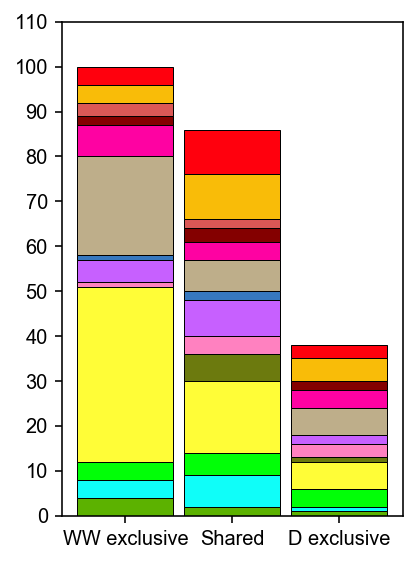

In [20]:
fig, axR = plt.subplots(figsize=(3, 4))

# Right
green_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(C4_watered, C4_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0, height=v, bottom=green_bottom, color = colormap[k], edgecolor="black", width=0.45,linewidth=0.5)
    green_bottom+=v

green_yellow_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.intersection(C4_watered, C4_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0.5, height=v, bottom=green_yellow_bottom, color = colormap[k], edgecolor="black", width=0.45,linewidth=0.5)
    green_yellow_bottom+=v
    
yellow_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(C4_drought, C4_watered)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
#     v = v/len(c_watered.union(c_drought))
    axR.bar(x=1, height=v, bottom=yellow_bottom, color = colormap[k], edgecolor="black", width=0.45,linewidth=0.5)
    yellow_bottom+=v

axR.set_xticks([0,0.5,1])
axR.set_xticklabels(["WW exclusive", "Shared", "D exclusive"], rotation=0, size=10)
axR.set_yticks(np.arange(0,120,10))
axR.set_yticklabels(np.arange(0,120,10), size=10)
axR.set_ylim(0,110)

plt.tight_layout()
# plt.savefig("../Figures/Network-Analysis/P-amilis-WWC4-intersections.pdf", bbox_to_inches="tight", dpi=300)

In [21]:
print(len(pathways[pathways["genemodel"].isin(list(set.intersection(C4_watered, C4_drought)))]))
print(len(pathways[pathways["genemodel"].isin(list(set.intersection(C4_watered, C4_drought)))])/len(pathways[pathways["genemodel"].isin(list(set.union(C4_watered, C4_drought)))]))

86
0.38392857142857145


So 86 genes (~38%) of the C4 PGN was preserved.

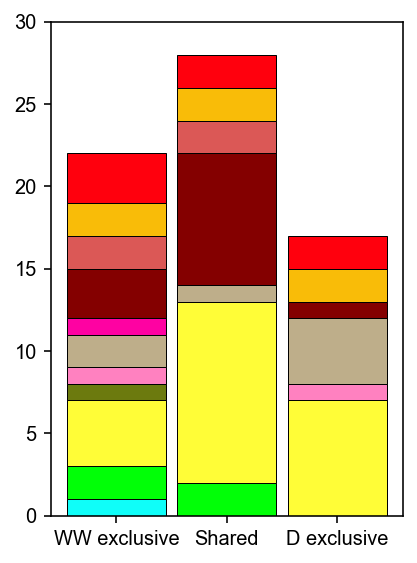

In [22]:
fig, axR = plt.subplots(figsize=(3, 4))

# Right
green_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(c_watered, c_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0, height=v, bottom=green_bottom, color = colormap[k], edgecolor="black", width=0.45,linewidth=0.5)
    green_bottom+=v

green_yellow_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.intersection(c_watered, c_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0.5, height=v, bottom=green_yellow_bottom, color = colormap[k], edgecolor="black", width=0.45,linewidth=0.5)
    green_yellow_bottom+=v
    
yellow_bottom = 0
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(c_drought, c_watered)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
#     v = v/len(c_watered.union(c_drought))
    axR.bar(x=1, height=v, bottom=yellow_bottom, color = colormap[k], edgecolor="black", width=0.45,linewidth=0.5)
    yellow_bottom+=v

axR.set_xticks([0,0.5,1])
axR.set_xticklabels(["WW exclusive", "Shared", "D exclusive"], rotation=0, size=10)
axR.set_yticks(np.arange(0,35,5))
axR.set_yticklabels(np.arange(0,35,5), size=10)
axR.set_ylim(0,30)

plt.tight_layout()
# plt.savefig("../Figures/Network-Analysis/P-amilis-PPC-1E1c-intersections.pdf", bbox_to_inches="tight", dpi=300)

In [23]:
print(len(pathways[pathways["genemodel"].isin(list(set.intersection(c_watered, c_drought)))]))
print(len(pathways[pathways["genemodel"].isin(list(set.intersection(c_watered, c_drought)))])/len(pathways[pathways["genemodel"].isin(list(set.union(c_watered, c_drought)))]))

28
0.417910447761194


And 28 genes (~42%) of the _PPC-1E1c_ PGN were preserved.

## _P. amilis_ drought exclusive C4 PGN
The daytime portion of CAM should be indistinguishable from the C4 cycle, but we might be able to see if by isolating just those genes that gained their expression patterns under drought. 

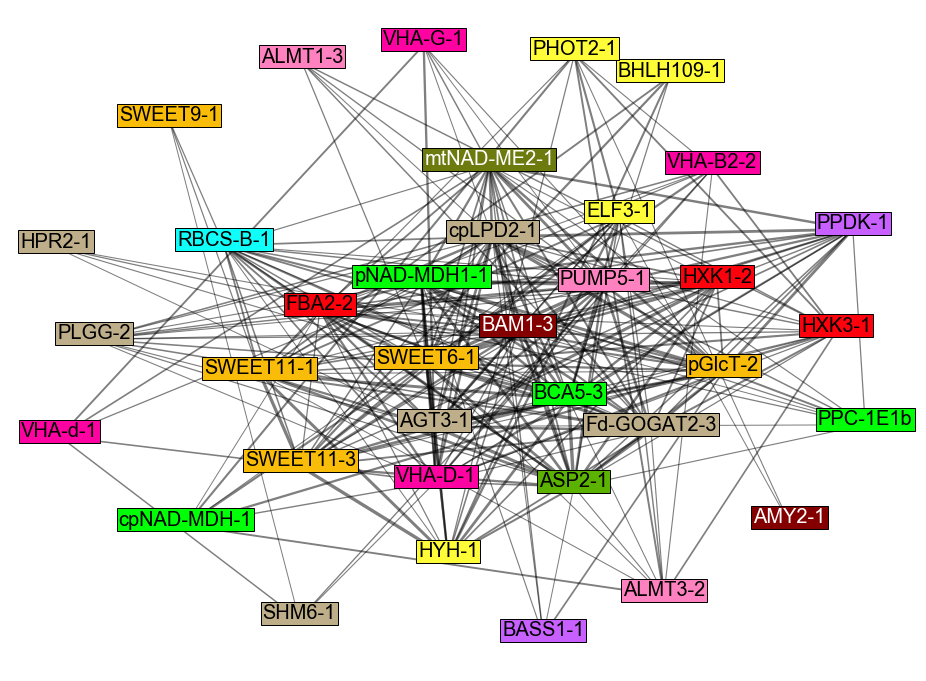

In [24]:
graph = remove_singletons(dG.subgraph(C4_drought.difference(C4_watered)))
degreedict = dict(graph.degree(graph.nodes))

fig, ax = plt.subplots(figsize=(8,6))
pos = nx.spring_layout(graph, k=15, iterations=500)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()])
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], 
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[pathways[pathways['genemodel']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax.text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=10)

ax.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-drought-exclusive-C4.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

We do see some intriguing things in here; notably the *mtNAD-ME2-1* and *PUMP5-1*, which could signal a mitochondrial decarboxylation pathways used by CAM. However, we've got some photorespiratory genes in here too, so may be picking up more oxidative stress leading to flux through the mitochondria. However, photorespiration tended to because less in sync under water stress, and Ferrari et al. (2020) also saw physiological signs of decreased photorespiration under drought. We've also captured two copies of *ALMT* (although *ALMT3-2* is very lowly expressed), and numerous vacuolar transporters (*SWEET*s) and parts of the vacuolar proton pump (*VHA* subunits).

## _P. amilis_ drought _PPC-1E1c_ PGN
Now we'll take a look at the drought module that contains *PPC-1E1c*, which presumably should also contain most of the nocturnal CAM cycle

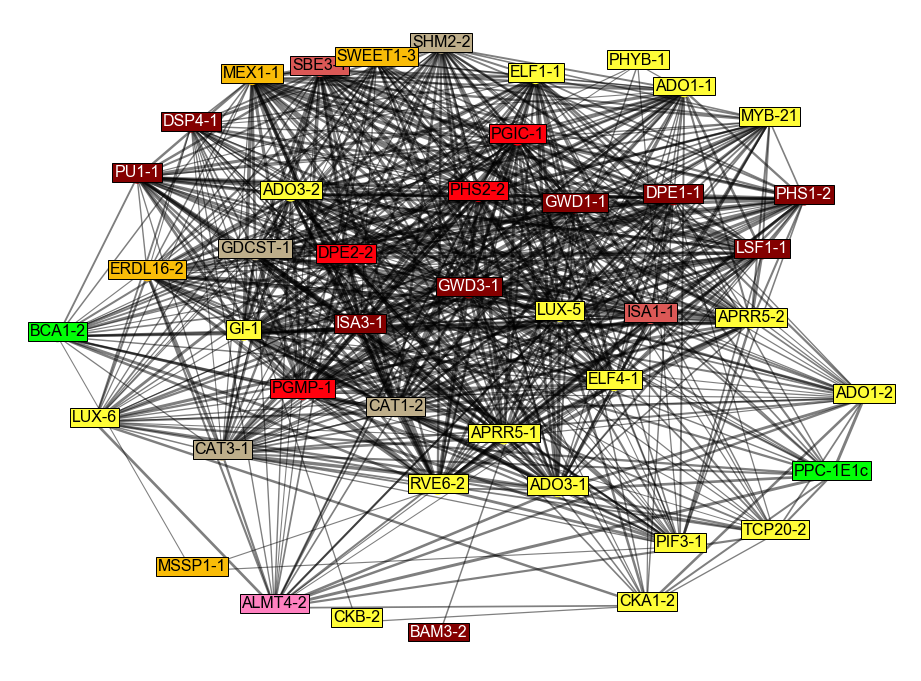

In [25]:
graph = remove_singletons(dG.subgraph(c_drought))
degreedict = dict(graph.degree(graph.nodes))

fig, ax = plt.subplots(figsize=(8,6))
pos = nx.spring_layout(graph, k=6.5, iterations=150)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()])
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], 
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[pathways[pathways['genemodel']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax.text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=8)

ax.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-PPC-1E1c-drought.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

We've got a lot fo the CAM cycle but we're missing an MDH, possibly PPCK, and the end parts of the carbohydrate to PEP pathway that includes ENO. 

## _P. amilis_ drought exclusive _PPC-1E1c_ PGN
We'll focus here on just those elements that join the *PPC-1E1c* module under drought.

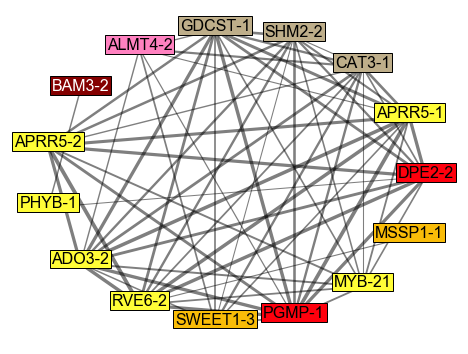

In [26]:
graph = remove_singletons(dG.subgraph(c_drought.difference(c_watered)))
degreedict = dict(graph.degree(graph.nodes))

fig, ax = plt.subplots(figsize=(3.75,3))
pos = nx.circular_layout(graph,)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()])
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], 
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[pathways[pathways['genemodel']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax.text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=8)

ax.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-PPC-1E1c-drought-exclusive.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

So the drought exclusive network brings in a copy of ALMT, which is actually the most highly expresed copy. Now I'll attempt to use the ISMAGS algorithm to find the largest common subgraph between drought and well-watered. The difference between the subgraph induced by common genes and the maximum common subgraph from ISMAGS is that the former will show the connects between the common genes regardless if they are corrlated to the same genes (i.e., regardless of the edges) and the latter only returns nodes with the exact same edge structure.

**NOTE: The ISMAGS algorithm has a very long run time. It took on the order of ~1hr on my local machine (4 cores, 16Gb memory) for just a few dozen genes. I would reccomend running this chunk on an HPC machine if possible.**

In [27]:
# shared_c_gms = list(c_watered.intersection(c_drought))
# c_d_graph = remove_singletons(dG.subgraph(shared_c_gms))
# c_ww_graph = remove_singletons(dG.subgraph(shared_c_gms))
# c_ismags = nx.isomorphism.ISMAGS(c_d_graph, c_ww_graph)
# c_lcsg = list(c_ismags.largest_common_subgraph())

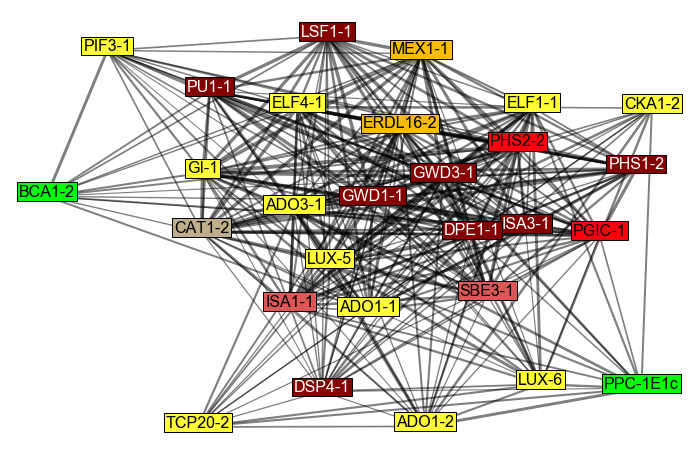

In [509]:
graph = remove_singletons(dG.subgraph(c_lcsg[0].values()))
degreedict = dict(graph.degree(graph.nodes))

fig, ax = plt.subplots(figsize=(6,4))
pos = nx.spring_layout(graph, k=2)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()])
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], 
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[pathways[pathways['genemodel']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax.text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=8)

ax.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-PPC-1E1c-largest-common-subgraph.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

The maximum common subgraph shows us that the connection of *PPC-1E1c* and *BCA1-2* to starch turn over is exactly preserved across conditions and is therefore constituively expressed.

# Interspecific network comparisons 
Below I'll compare the _P. amilis_ PGNs with those of _P. oleracea_ (see `PO-network-plotting.ipynb`). Of particular interest are

- the shared C4 and CAM subgraphs
- the exclusive portions of the C4 subgraphs

In [28]:
po_wwG = pickle.load(open("../Network-analysis/P-oleracea-WW-PGN.txt", "rb"))
po_dG = pickle.load(open("../Network-analysis/P-oleracea-D-PGN.txt", "rb"))

In [29]:
po_pathways = pd.read_csv("~/Dropbox/Drought-experiments/Drought_Experiment_3/Network-analysis/P-oleracea-pathways-modules.csv")
po_pathways = po_pathways.fillna('')

po_WWC4 = po_pathways[po_pathways["WGCNA_ww"].isin([1,2])]
po_DC4 = po_pathways[po_pathways["WGCNA_d"].isin([3,4])]
po_c_ww = po_pathways[po_pathways["WGCNA_ww"].isin([4,8])]
po_c_d = po_pathways[po_pathways["WGCNA_d"].isin([2,5,9])]

In [30]:
print("Number of unique ortholog groups: {}".format(len(set(po_WWC4.Uniprot).union(set(pathways[pathways["genemodel"].isin(C4_watered)].Uniprot)))))

Number of unique ortholog groups: 258


Now I'll see how much the C4 networks overlap in terms of gene families. Presumably there should be high overlap at this level but maybe not at the ortholog level if we believe that they have differentially co-opted genes for C4.

In [31]:
s1 = set(pathways[pathways['genemodel'].isin(C4_drought.intersection(C4_watered))]["Gene-family"])
s2 = set(po_WWC4["Gene-family"]).intersection(set(po_DC4["Gene-family"]))
len(s1.intersection(s2))/len(s1.union(s2))

0.5833333333333334

So yes, nearly 60% of the gene families are shared. Now we can return to some stack bars to see how the orthologs line up.

Orthologs unique to P. amilis: 117
Shared orthologs: 69
Orthologs unique to P. oleracea: 72


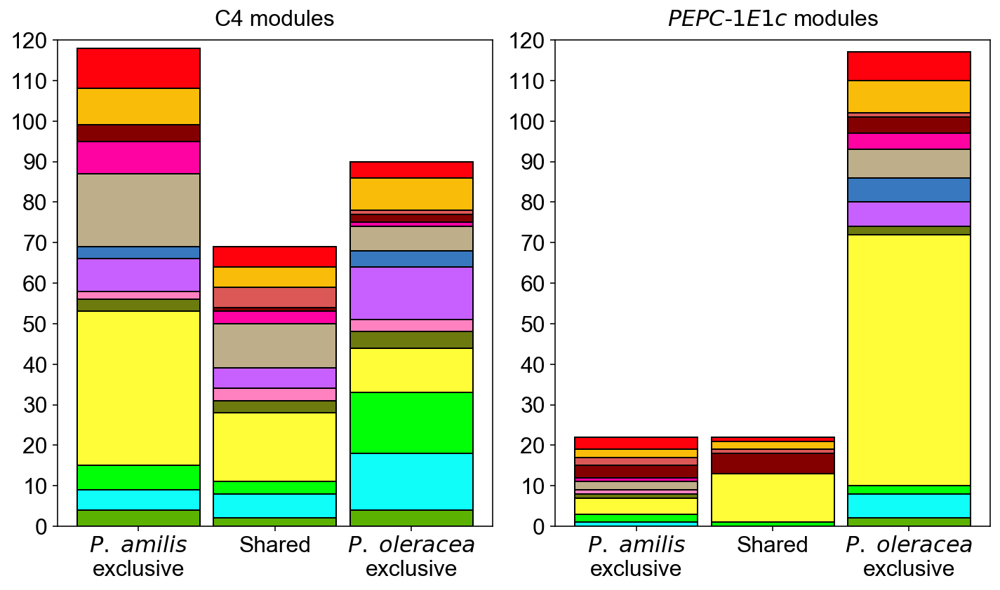

In [34]:
fig, (axL, axR) = plt.subplots(ncols=2, nrows=1, figsize=(10,6))

# Left
purple_bottom = 0
amilis_set = set(pathways[pathways["genemodel"].isin(C4_watered)].Uniprot.values).difference(set(po_WWC4.Uniprot.values))
print("Orthologs unique to P. amilis: {}".format(len(amilis_set)))
for k,v in pathways[pathways["Uniprot"].isin(amilis_set)]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axL.bar(x=0, height=v, bottom=purple_bottom, color = colormap[k], edgecolor="black", width=0.45)
    purple_bottom+=v

purple_blue_bottom = 0
shared_set = set(pathways[pathways["genemodel"].isin(C4_watered)].Uniprot.values).intersection(set(po_WWC4.Uniprot.values))
print("Shared orthologs: {}".format(len(shared_set)))
for k,v in pathways[pathways["Uniprot"].isin(shared_set)]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axL.bar(x=0.5, height=v, bottom=purple_blue_bottom, color = colormap[k], edgecolor="black", width=0.45)
    purple_blue_bottom+=v
    
blue_bottom = 0
oleracea_set = set(po_WWC4.Uniprot.values).difference(set(pathways[pathways["genemodel"].isin(C4_watered)].Uniprot.values))
print("Orthologs unique to P. oleracea: {}".format(len(oleracea_set)))
for k,v in po_pathways[po_pathways["Uniprot"].isin(oleracea_set)]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axL.bar(x=1, height=v, bottom=blue_bottom, color = colormap[k], edgecolor="black", width=0.45)
    blue_bottom+=v

# Right
green_bottom = 0
amilis_set = set(pathways[pathways["genemodel"].isin(c_drought)].Uniprot.values).difference(set(po_c_d.Uniprot.values))
for k,v in pathways[pathways["genemodel"].isin(list(set.difference(c_watered, c_drought)))]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0, height=v, bottom=green_bottom, color = colormap[k], edgecolor="black", width=0.45)
    green_bottom+=v

green_yellow_bottom = 0
shared_set = set(pathways[pathways["genemodel"].isin(c_drought)].Uniprot.values).intersection(set(po_c_d.Uniprot.values))
for k,v in pathways[pathways["Uniprot"].isin(shared_set)]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=0.5, height=v, bottom=green_yellow_bottom, color = colormap[k], edgecolor="black", width=0.45)
    green_yellow_bottom+=v
    
yellow_bottom = 0
oleracea_set = set(po_c_d.Uniprot.values).difference(set(pathways[pathways["genemodel"].isin(c_drought)].Uniprot.values))
for k,v in po_c_d[po_c_d["Uniprot"].isin(oleracea_set)]["Pathway"].value_counts(sort=False).sort_index().iteritems():
    axR.bar(x=1, height=v, bottom=yellow_bottom, color = colormap[k], edgecolor="black", width=0.45)
    yellow_bottom+=v
    
handles = []
for i, (k,v) in enumerate(sorted(colormap.items(), reverse=True)):
    if k == "Circadian rhythm/Light response": k = "Circadian rhythm/\nLight response"
    handles.append(mpatches.Patch(color=v, label=k, ec="black"))
leg_ax.legend(handles=handles, loc="center", frameon=False, fontsize=16, ncol=3)
leg_ax.axis("off")

for ax in [axL, axR]:
    ax.set_xticks([0,0.5,1])
    ax.set_xticklabels(["$P.$ $amilis$\nexclusive", "Shared", "$P.$ $oleracea$\nexclusive"], rotation=0, size=16)

axL.set_yticks(np.arange(0,130,10))
axL.set_yticklabels(np.arange(0,130,10), size=16)
axR.set_yticks(np.arange(0,130,10))
axR.set_yticklabels(np.arange(0,130,10), size=16)
axL.set_ylim(0,120)
axR.set_ylim(0,120)

axL.set_title("C4 modules", size=16, pad=10)
axR.set_title("$PEPC$-$1E1c$ modules", size=16, pad=10)
# ax[1].axis("off")

plt.tight_layout()
# plt.savefig("../Figures/Network-Analysis/Portulaca-PEPC-module-intersections.pdf", bbox_to_inches="tight", dpi=300)

So the shared portion of the _PPC-1E1c_ modules looks very small, but I believe this is an artifact of including multiple  _P. oleracea_ modules. Now to extract the subgraphs of common genes from the two species.

## Conserved _PPC-1E1c_ subnetwork
First I'll just see what the _P. amilis_ and _P. oleracea_ networks look like that share the common set of genes. Later I'll use the ISMAGS algorithm to find the maximum common induced subgraph.

In [35]:
portulaca_c_unis = list(set(pathways[pathways["genemodel"].isin(c_drought)].Uniprot.values).intersection(set(po_c_d.Uniprot.values)))
pa_c_d_graph = remove_singletons(dG.subgraph(pathways[pathways["Uniprot"].isin(portulaca_c_unis)]["genemodel"]))
po_c_d_graph = remove_singletons(po_dG.subgraph(po_c_d[po_c_d["Uniprot"].isin(portulaca_c_unis)]["transcript"]))

# Relabel P. oleracea genes for visualization
relabeler = {}
for m in po_c_d_graph.nodes():
    relabeler[m] = po_c_d[po_c_d['transcript']==m]["Pamilis-ortholog"].values[0]
po_c_d_graph_relabeled = nx.relabel_nodes(po_c_d_graph, relabeler)

This next block finds and colors the common edges in the two networks.

In [36]:
po_c_d_ecs = []
translated_edges = []
for e in po_c_d_graph.edges():
    translated = (po_c_d[po_c_d["transcript"]==e[0]]["Pamilis-ortholog"].values[0], 
                  po_c_d[po_c_d["transcript"]==e[1]]["Pamilis-ortholog"].values[0])
    translated_edges.append(translated)
    if translated in list(pa_c_d_graph.edges()):
        po_c_d_ecs.append("xkcd:amber")
    else:
        po_c_d_ecs.append("xkcd:black")
        
pa_c_d_ecs = []
for e in pa_c_d_graph.edges():
    if e in translated_edges:
        pa_c_d_ecs.append("xkcd:amber")
    else:
        pa_c_d_ecs.append("xkcd:black")

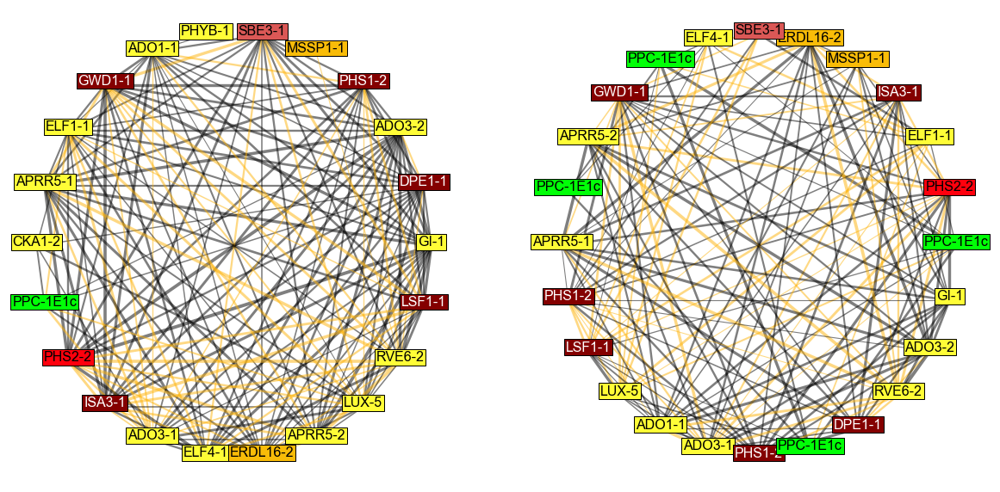

In [37]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
graph = pa_c_d_graph.copy()
degreedict = dict(graph.degree(graph.nodes))
pos = nx.circular_layout(graph)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()], ax=ax[0], edge_color=pa_c_d_ecs)
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], ax=ax[0],
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[pathways[pathways['genemodel']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax[0].text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=8)
    
graph = po_c_d_graph.copy()
degreedict = dict(graph.degree(graph.nodes))
pos = nx.circular_layout(graph)
nodecolors = [colormap[po_c_d[po_c_d["transcript"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()], ax=ax[1], edge_color=po_c_d_ecs)
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], ax=ax[1],
                        node_color = nodecolors, label=po_c_d[po_c_d["Pamilis-ortholog"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(po_c_d[po_c_d['transcript']==m]["Uniprot"].values[0])
    color = colormap[po_c_d[po_c_d['transcript']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[po_c_d[po_c_d['transcript']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax[1].text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=8)
    
ax[0].axis("off")
ax[1].axis("off");
# plt.savefig("../Figures/Network-Analysis/Portulaca-common-PEPC-1E1c-PGNs.pdf", bbox_to_inches="tight", dpi=300)

**Again, the ISMAGS algorithm is very resource intense! Try to run the next block on an HPC**

In [38]:
# portulaca_c_ismags = nx.isomorphism.ISMAGS(pa_c_d_graph, po_c_d_graph)
# portulaca_c_lcsg = list(portulaca_c_ismags.largest_common_subgraph())
# portulaca_c_lcsg = portulaca_c_lcsg[0]

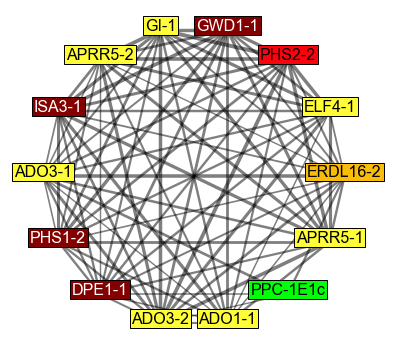

In [152]:
graph = remove_singletons(dG.subgraph(list(portulaca_c_lcsg.values())+["FUN_029936"]))
# pickle.dump(graph, open("../Network-analysis/P-amilis-PPC-1E1c-ISMAGS.txt", 'wb'))
degreedict = dict(graph.degree(graph.nodes))

fig, ax = plt.subplots(figsize=(3,3))
pos = nx.circular_layout(graph)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()])
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], 
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_d_cmap[pathways[pathways['genemodel']==m]["WGCNA_d"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax.text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=8)

ax.axis('off');
# plt.savefig("../Figures/Network-Analysis/P-amilis-PPC-1E1c-ISMAGS.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

The maximum common subgraph still contains many of the interesting parts of the nighttime CAM cycle, as noted above.

## Conserved C4 subnetwork
### Well-watered
Again, I'll start with the networks that contain the common set of genes before getting into the maximum subgraph.

In [39]:
portulaca_C4_unis = list(set(pathways[pathways["genemodel"].isin(C4_watered)].Uniprot.values).intersection(set(po_WWC4.Uniprot.values)))
pa_C4_ww_graph = remove_singletons(wwG.subgraph(pathways[pathways["Uniprot"].isin(portulaca_C4_unis)]["genemodel"]))
po_C4_ww_graph = remove_singletons(po_wwG.subgraph(po_WWC4[po_WWC4["Uniprot"].isin(portulaca_C4_unis)]["transcript"]))
portulaca_C4_unis = set(pathways[pathways["genemodel"].isin(pa_C4_ww_graph.nodes())]["Uniprot"]).intersection(set(po_WWC4[po_WWC4["transcript"].isin(po_C4_ww_graph.nodes())]["Uniprot"]))
pa_C4_ww_graph = remove_singletons(wwG.subgraph(pathways[pathways["Uniprot"].isin(portulaca_C4_unis)]["genemodel"]))
po_C4_ww_graph = remove_singletons(po_wwG.subgraph(po_WWC4[po_WWC4["Uniprot"].isin(portulaca_C4_unis)]["transcript"]))

In [40]:
po_C4_ecs = []
translated_edges = []
for e in po_C4_ww_graph.edges():
    translated = (po_WWC4[po_WWC4["transcript"]==e[0]]["Pamilis-ortholog"].values[0], 
                  po_WWC4[po_WWC4["transcript"]==e[1]]["Pamilis-ortholog"].values[0])
    translated_edges.append(translated)
    if translated in list(pa_C4_ww_graph.edges()):
        po_C4_ecs.append("xkcd:amber")
    else:
        po_C4_ecs.append("xkcd:black")
        
pa_C4_ecs = []
for e in pa_C4_ww_graph.edges():
    if e in translated_edges:
        pa_C4_ecs.append("xkcd:amber")
    else:
        pa_C4_ecs.append("xkcd:black")

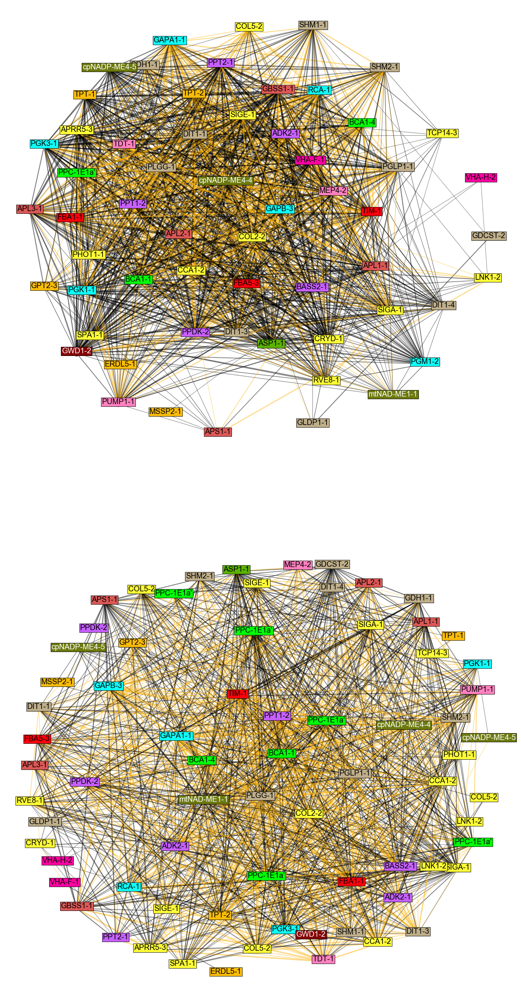

In [41]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12,24))
graph = pa_C4_ww_graph.copy()
degreedict = dict(graph.degree(graph.nodes))
pos = nx.spring_layout(graph, k=2.5, iterations=50)
nodecolors = [colormap[pathways[pathways["genemodel"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()], ax=ax[0], edge_color=pa_C4_ecs)
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], ax=ax[0],
                        node_color = nodecolors, label=pathways[pathways["genemodel"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(pathways[pathways['genemodel']==m]["Uniprot"].values[0])
    color = colormap[pathways[pathways['genemodel']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_ww_cmap[pathways[pathways['genemodel']==m]["WGCNA_ww"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax[0].text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=10)
    
graph = po_C4_ww_graph.copy()
degreedict = dict(graph.degree(graph.nodes))
pos = nx.spring_layout(graph, k=2.5, iterations=50)
nodecolors = [colormap[po_WWC4[po_WWC4["transcript"]==n]["Pathway"].values[0]] for n in graph.nodes]

ec = nx.draw_networkx_edges(graph, pos, alpha=0.5, width=[graph[u][v]['weight']*2 for u,v in graph.edges()], ax=ax[1], edge_color=po_C4_ecs)
nc = nx.draw_networkx_nodes(graph, pos, nodelist = graph.nodes, node_size=[v for v in degreedict.values()], ax=ax[1],
                        node_color = nodecolors, label=po_WWC4[po_WWC4["Pamilis-ortholog"].isin(list(graph.nodes))]["Pathway"].values)

for m,(x,y) in pos.items():
    label = str(po_WWC4[po_WWC4['transcript']==m]["Uniprot"].values[0])
    color = colormap[po_WWC4[po_WWC4['transcript']==m]["Pathway"].values[0]]
    edgecolor = WGCNA_ww_cmap[po_WWC4[po_WWC4['transcript']==m]["WGCNA_ww"].values[0]]
    if color in ["xkcd:strong blue", "xkcd:dark red", "xkcd:blue violet", "xkcd:murky green"]: 
        fontcolor = "white"
    else:
        fontcolor = "black"
    ax[1].text(x, y, s=label, bbox=dict(facecolor=color, alpha=1, edgecolor='black', linewidth=0.5, pad=1), 
            horizontalalignment='center', fontdict={"color":fontcolor}, size=10)
    
ax[0].axis("off")
ax[1].axis("off");
# plt.savefig("../Figures/Network-Analysis/Portulaca-common-WWC4-PGNs.pdf", bbox_to_inches="tight", dpi=300)

### Drought exclusive
I'm going to use the drought exclusive C4 PGNs to attempt to find the diurnal portion of the CAM cycle. CAM should be ancestral to _Portulaca_ and therefore shared between the two species, so I'll first take the intersection of the two PGNs. Second, if these genes are CAM-specific they should be upregulated under drought in the daytime. So I'll use the abundance data from sleuth and kallisto to assess this.

In [42]:
pa_WWC4 = pathways[pathways["genemodel"].isin(C4_watered)]
pa_DC4 = pathways[pathways["genemodel"].isin(C4_drought)]
pa_WWC4_ex = pa_WWC4[pa_WWC4["Uniprot"].isin(set(pa_WWC4.Uniprot.unique()).difference(set(po_WWC4.Uniprot.unique())))]
po_WWC4_ex = po_WWC4[po_WWC4["Uniprot"].isin(set(po_WWC4.Uniprot.unique()).difference(set(pa_WWC4.Uniprot.unique())))]
pa_DC4_ex = pa_DC4[pa_DC4["Uniprot"].isin(set(pa_DC4.Uniprot.unique()).difference(set(po_DC4.Uniprot.unique())))]
po_DC4_ex = po_DC4[po_DC4["Uniprot"].isin(set(po_DC4.Uniprot.unique()).difference(set(pa_DC4.Uniprot.unique())))]

In [43]:
portulaca_DC4_unis = list(set(pathways[pathways["genemodel"].isin(C4_drought)].Uniprot.values).intersection(set(po_DC4.Uniprot.values)))
pa_C4_d_graph = remove_singletons(dG.subgraph(pathways[pathways["Uniprot"].isin(portulaca_DC4_unis)]["genemodel"]))
po_C4_d_graph = remove_singletons(po_dG.subgraph(po_DC4[po_DC4["Uniprot"].isin(portulaca_DC4_unis)]["transcript"]))
portulaca_DC4_unis = set(pathways[pathways["genemodel"].isin(pa_C4_d_graph.nodes())]["Uniprot"]).intersection(set(po_DC4[po_DC4["transcript"].isin(po_C4_d_graph.nodes())]["Uniprot"]))
pa_C4_d_graph = remove_singletons(dG.subgraph(pathways[pathways["Uniprot"].isin(portulaca_DC4_unis)]["genemodel"]))
po_C4_d_graph = remove_singletons(po_dG.subgraph(po_DC4[po_DC4["Uniprot"].isin(portulaca_DC4_unis)]["transcript"]))

In [46]:
paCounts = pd.read_csv("../Abundance-analysis/sleuth/P-amilis-TPM-with-metadata.csv")
poCounts = pd.read_csv("../Abundance-analysis/sleuth/P-oleracea-unigenes-TPM-with-metadata.csv")

paSleuth = pd.read_csv("../Abundance-analysis/sleuth/P-amilis-sleuth-DEgenes.csv", index_col=0)
poSleuth = pd.read_csv("../Abundance-analysis/sleuth/P-oleracea-sleuth-DEgenes.csv", index_col=0)
paSleuth = paSleuth[paSleuth["target_id"].isin(pathways[pathways["Uniprot"].isin(portulaca_DC4_unis)].genemodel.values)]
poSleuth = poSleuth[poSleuth["target_id"].isin(po_DC4[po_DC4["Uniprot"].isin(portulaca_DC4_unis)].transcript.values)]
paSleuth = paSleuth[paSleuth["qval"]<0.01]
poSleuth = poSleuth[poSleuth["qval"]<0.01]

paCounts = paCounts[paCounts["gene"].isin(paSleuth.target_id.values)]
poCounts = poCounts[poCounts["unigene"].isin(poSleuth.target_id.values)]

In [47]:
paUpregulated = []
for t in paSleuth.target_id.values:
    subset = paCounts[paCounts["gene"]==t]      
    subset = subset.groupby(["individual", "time_point"]).sum()["tpm"].reset_index().groupby("time_point").describe()
    if sum(subset["tpm"]["50%"][4:6].values-subset["tpm"]["50%"][:2].values)>0:
        paUpregulated.append(t)

poUpregulated = []
for t in poSleuth.target_id.values:
    subset = poCounts[poCounts["unigene"]==t]      
    subset = subset.groupby(["individual", "time_point"]).sum()["tpm"].reset_index().groupby("time_point").describe()
    if sum(subset["tpm"]["50%"][4:6].values-subset["tpm"]["50%"][:2].values)>0:
        poUpregulated.append(t)        

In [48]:
pa_DC4[pa_DC4["genemodel"].isin(paUpregulated) & pa_DC4["genemodel"].isin(po_DC4[po_DC4["transcript"].isin(poUpregulated)]["Pamilis-ortholog"].values)]

,Arabidopsis ortholog,genemodel,Uniprot,Gene-family,Block-description,Pathway,Localization,qval,WGCNA_ww,WGCNA_d,local_uniprot,wwDegree,dDegree,pathway_color
8,"AT2G38400, AT3G08860",FUN_003986,AGT3-1,AGT,Alanine-glyoxylate aminotransferase 3,Photorespiration,mitochondria,2.287055e-08,7.0,6.0,mtAGT3-1,NaN,104.0,xkcd:putty
20,AT1G76130,FUN_025702,AMY2-1,AMY,Alpha-amylase 2,Starch degradation,chloroplast,2.719696e-14,11.0,5.0,cpAMY2-1,4.0,3.0,xkcd:dark red
48,AT3G23920,FUN_033111,BAM1-3,BAM,Beta-amylase 1,Starch degradation,chloroplast,9.757980e-10,12.0,6.0,cpBAM1-3,3.0,111.0,xkcd:dark red
65,"AT1G58180, AT4G33580",FUN_052022,BCA5-3,BCA,Beta carbonic anhydrase 5,Carboxylation,unknown,1.625378e-13,29.0,6.0,BCA5-3,10.0,114.0,xkcd:bright green
178,AT1G61800,FUN_035278,GPT2-3,GPT,Glucose-6-phosphate/phosphate translocator 2,Starch/sugar transport,chloroplast,7.568259e-06,3.0,6.0,cpGPT2-3,73.0,105.0,xkcd:golden rod
202,AT3G17609,FUN_014198,HYH-1,HY,Transcription factor HY5-like,Circadian/Light response,NaN,3.319235e-04,2.0,6.0,HYH-1,7.0,90.0,xkcd:sunshine yellow
211,"AT4G16155, AT3G16950",FUN_014956,cpLPD2-1,LPD,Dihydrolipoyl dehydrogenase/Glycine cleavage s...,Photorespiration,chloroplast,1.525467e-04,10.0,6.0,cpLPD2-1,11.0,100.0,xkcd:putty
232,AT1G79750,FUN_015913,cpNADP-ME4-5,ME,"NADP-dependent malic enzyme 4, chloroplastic",Decarboxylation,chloroplast,2.565839e-08,1.0,6.0,cpNADP-ME4-5,118.0,108.0,xkcd:murky green
352,AT5G26780,FUN_038563,SHM2-3,SHM,Serine hydroxymethyltransferase 2,Photorespiration,mitochondria,3.662899e-04,1.0,5.0,mtSHM2-3,104.0,30.0,xkcd:putty
373,"AT5G23660, AT3G48740, AT5G50800, AT4G25010",FUN_046974,SWEET11-3,SWEET,Bidirectional sugar transporter 11,Starch/sugar transport,vacuole,7.584874e-26,2.0,6.0,vaSWEET11-3,2.0,108.0,xkcd:golden rod


So we don't recover a ton here but we do see *cpNADP-ME4-5*, which could indicate that teh ancestral CAM cycle used the chloroplastic route.

## Plotting z-scores and module categories
Here I'll combine the module funcational category histograms with the _z_-score normalized plots of the modules.

In [49]:
sleuth_all = pd.read_csv("../Abundance-analysis/sleuth/P-amilis-genes-TPM-with-metadata.csv")
sleuth = sleuth_all[sleuth_all["gene"].isin(pathways['genemodel'])]
del sleuth_all
sleuth = sleuth.drop(labels="Unnamed: 0", axis=1).reset_index(drop=True).rename({"gene":"genemodel"}, axis=1)
sleuth = sleuth.merge(pathways).drop(labels=["RNA_No", "Collection_time", "Acc_No"], axis=1)

watered_grouped = sleuth[sleuth["time_point"]<4].groupby(["time_point", "genemodel"]).describe()["tpm"]
watered_grouped = watered_grouped.reset_index()

drought_grouped = sleuth[sleuth["time_point"]>=4].groupby(["time_point", "genemodel"]).describe()["tpm"]
drought_grouped = drought_grouped.reset_index()

watered_pivot = watered_grouped.pivot(index="genemodel", columns="time_point", values="50%")
drought_pivot = drought_grouped.pivot(index="genemodel", columns="time_point", values="50%")

w_X = np.transpose(watered_pivot[[0,1,2,3]].values.copy())
w_X = np.transpose(StandardScaler().fit_transform(w_X))
w_X = pd.DataFrame(w_X, index=watered_pivot.index, columns=[0,1,2,3]).reset_index().merge(pathways[["genemodel", "Pathway",'WGCNA_ww',"WGCNA_d"]], on="genemodel")

d_X = np.transpose(drought_pivot[[4,5,6,7]].values.copy())
d_X = np.transpose(StandardScaler().fit_transform(d_X))
d_X = pd.DataFrame(d_X, index=drought_pivot.index, columns=[0,1,2,3]).reset_index().merge(pathways[["genemodel", "Pathway",'WGCNA_ww',"WGCNA_d"]], on="genemodel")

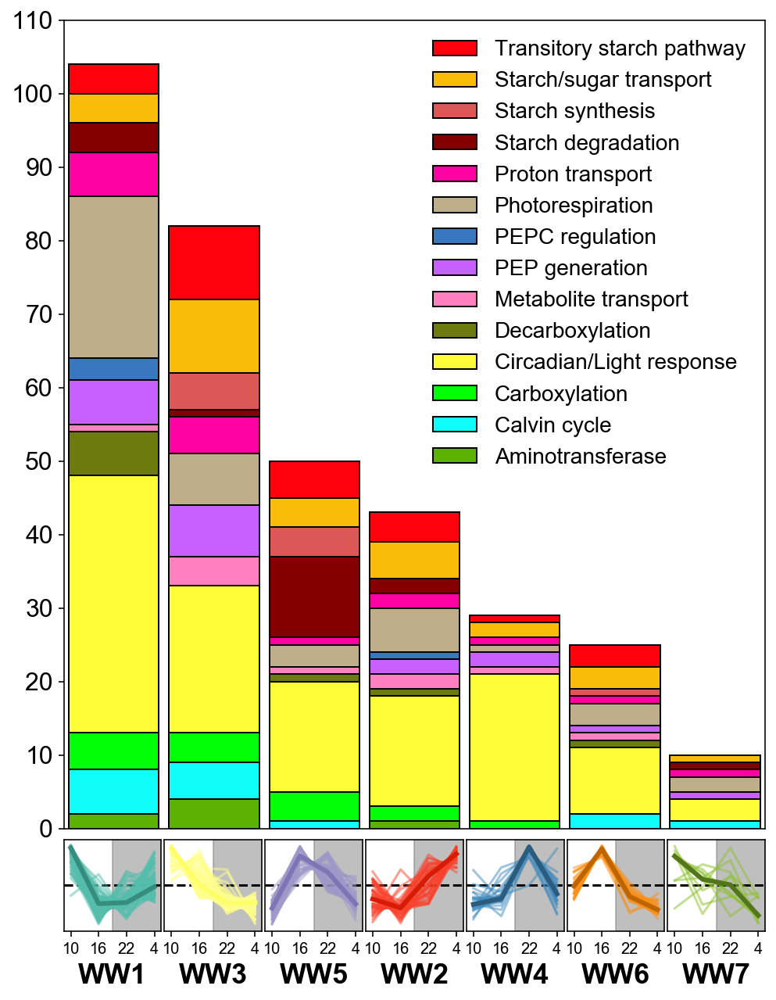

In [50]:
fig = plt.figure(constrained_layout=False, figsize=(7,9))

gs = fig.add_gridspec(nrows=9, ncols=7)
ax_w01 = fig.add_subplot(gs[8, 0])
ax_w02 = fig.add_subplot(gs[8, 1])
ax_w03 = fig.add_subplot(gs[8, 2])
ax_w04 = fig.add_subplot(gs[8, 3])
ax_w05 = fig.add_subplot(gs[8, 4])
ax_w06 = fig.add_subplot(gs[8, 5])
ax_w07 = fig.add_subplot(gs[8, 6])
# ax_w08 = fig.add_subplot(gs[8, 7])
ax_bg = fig.add_subplot(gs[0:-1, 0:])

for i, ax in enumerate(fig.get_axes()):
    ax.set_xticks([])
    ax.set_yticks([])

x=0
for i,v in pathways["WGCNA_ww"].value_counts().items():
    if v>=10:
        bottom = 0
        for k,p in pathways[pathways["WGCNA_ww"]==i]["Pathway"].value_counts(sort=False).sort_index().iteritems():
            ax_bg.bar(x=x, height=p, bottom=bottom, color = colormap[k], edgecolor="black", width=0.9, align="center")
            bottom+=p
        x+=1
        
handles = []
for i, (k,v) in enumerate(sorted(colormap.items(), reverse=True)):
    if k == "Circadian rhythm/Light response": k = "Circadian rhythm/\nLight response"
    handles.append(mpatches.Patch(color=v, label=k, ec="black"))
ax_bg.legend(handles=handles, loc="upper right", frameon=False, fontsize=14, ncol=1)

ax_bg.set_yticks(np.arange(0,120,10))
ax_bg.set_yticklabels(np.arange(0,120,10), size=16)
ax_bg.set_xlim(-0.5,6.5)
ax_bg.set_ylim(0,110)

ax = fig.get_axes()
for i,(k,c) in enumerate(WGCNA_ww_cmap.items()):
    if c == "xkcd:white":
        continue
    else:
        rect = mpatches.Rectangle(xy=(1.5, -2), width=1.75, height=4, color='grey', alpha=0.5)
        ax[i].add_patch(rect)
        ax[i].set_xlim(-0.25,3.25)
        ax[i].set_ylim(-2,2)
        
        ax[i].set_xticks([0,1,2,3])
        ax[i].set_xticklabels([10,16,22,4])
        
        subset = w_X[w_X["WGCNA_ww"]==k][[0,1,2,3]]
        for j, row in subset.iterrows():
            ax[i].plot(list(row[[0,1,2,3]]), color=lighten_color(c, 1.5), alpha=0.5)
        
        ax[i].hlines(y=0, xmin=-0.25, xmax=3.25, linestyle="--")
        ax[i].plot(subset.describe().T["50%"], lw=3, color=lighten_color(c, 2), label="Cluster {}".format(i+1),)
        ax[i].set_xlabel("WW{}".format(int(k)), size=18, weight="bold")

plt.tight_layout(w_pad=-0.15, h_pad=-0.2)
# plt.savefig("../Figures/Network-Analysis/P-amilis-well-watered-bar-profiles.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

(0.0, 1.0, 0.0, 1.0)

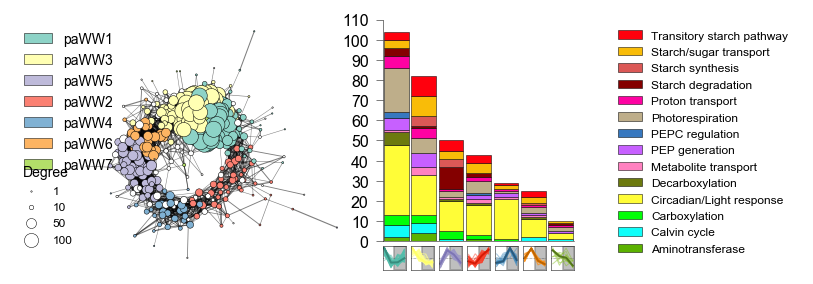

In [51]:
fig = plt.figure(constrained_layout=False, figsize=(6.75, 2.3))

gs = fig.add_gridspec(nrows=9, ncols=27)
ax_nxleg = fig.add_subplot(gs[:,0:3])
ax_nx = fig.add_subplot(gs[:,1:11])
ax_w01 = fig.add_subplot(gs[8, 12])
ax_w02 = fig.add_subplot(gs[8, 13])
ax_w03 = fig.add_subplot(gs[8, 14])
ax_w04 = fig.add_subplot(gs[8, 15])
ax_w05 = fig.add_subplot(gs[8, 16])
ax_w06 = fig.add_subplot(gs[8, 17])
ax_w07 = fig.add_subplot(gs[8, 18])
ax_bg = fig.add_subplot(gs[0:-1, 12:19])
ax_bgleg = fig.add_subplot(gs[:, 22:])

for i, ax in enumerate(fig.get_axes()):
    ax.set_xticks([])
    ax.set_yticks([])
    
# Module color legend
handles = []
for i, (k,v) in enumerate(WGCNA_ww_cmap.items()):
    if v == "xkcd:white": continue
    handles.append(mpatches.Patch(color=v, label="paWW{}".format(int(k)), ec="black", linewidth=0.25))
ax_nxleg.legend(handles=handles, loc="upper right", frameon=False, fontsize=7, ncol=1)

# Point size legend
axpsl = inset_axes(ax_nxleg, width="100%", height="100%", bbox_to_anchor=(0.5, 0.4, 0.1, 0.1), bbox_transform=ax_nxleg.transAxes)
axpsl.patch.set_facecolor("None")
l1 = axpsl.scatter([],[], s=0.5*1, c="white", edgecolors='black', label="1", linewidth=0.25)
l2 = axpsl.scatter([],[], s=0.5*10, c="white", edgecolors='black', label="10", linewidth=0.25)
l3 = axpsl.scatter([],[], s=0.5*50, c="white", edgecolors='black', label="50", linewidth=0.25)
l4 = axpsl.scatter([],[], s=0.5*100, c="white", edgecolors='black', label="100", linewidth=0.25)
axpsl.legend(title="Degree", fontsize="6", frameon=False, title_fontsize=7)
axpsl.axis("off")
ax_nxleg.axis('off')

# Network plot
pos = nx.kamada_kawai_layout(wwG)
WGCNA_ww_cmap = {}
for idx, (i,v) in enumerate(pathways["WGCNA_ww"].value_counts().items()):
    if idx == 8: idx+=1
    if v>=10: color = plt.cm.Set3(idx)
    else: color = "xkcd:white"
    WGCNA_ww_cmap[i] = color   
nodecolors = [WGCNA_ww_cmap[pathways[pathways["genemodel"]==n]["WGCNA_ww"].values[0]] for n in wwNodes]
ec = nx.draw_networkx_edges(wwG, pos, alpha=0.5, width=[wwG[u][v]['weight'] for u,v in wwG.edges()], ax=ax_nx)
nc = nx.draw_networkx_nodes(wwG, pos, nodelist = wwNodes, node_size=[v/2 for v in ww_degreedict.values()], 
                            node_color = nodecolors, linewidths=0.25, ax=ax_nx)
nc.set_edgecolor('black')
ax_nx.axis('off')

# Bar plot
x=0
for i,v in pathways["WGCNA_ww"].value_counts().items():
    if v>=10:
        bottom = 0
        for k,p in pathways[pathways["WGCNA_ww"]==i]["Pathway"].value_counts(sort=False).sort_index().iteritems():
            ax_bg.bar(x=x, height=p, bottom=bottom, color = colormap[k], edgecolor="black", 
                      width=0.9, align="center", linewidth=0.25)
            bottom+=p
        x+=1

ax_bg.tick_params(axis="y", which='both', width=0.25)
ax_bg.set_yticks(np.arange(0,120,10))
ax_bg.set_yticklabels(np.arange(0,120,10), size=8)
ax_bg.set_xlim(-0.5,6.5)
ax_bg.set_ylim(0,110)
for a in ['bottom','left']: ax_bg.spines[a].set_linewidth(0.25)
for a in ['top','right']: ax_bg.spines[a].set_linewidth(0)

# Z-score plots
for ax,(k,c) in zip([ax_w01,ax_w02,ax_w03,ax_w04,ax_w05,ax_w06,ax_w07],WGCNA_ww_cmap.items()):
    if c == "xkcd:white": continue
    else:
        rect = mpatches.Rectangle(xy=(1.5, -2), width=1.75, height=4, color='grey', alpha=0.5)
        ax.add_patch(rect)
        ax.set_xlim(-0.25,3.25)
        ax.set_ylim(-2,2)
        
        ax.tick_params(axis="x", which='both', length=0, width=0)
        ax.set_xticks([0,1,2,3])
        ax.set_xticklabels([])
        for a in ['top','bottom','left','right']: ax.spines[a].set_linewidth(0.25)
        
        subset = w_X[w_X["WGCNA_ww"]==k][[0,1,2,3]]
        for j, row in subset.iterrows(): 
            ax.plot(list(row[[0,1,2,3]]), color=lighten_color(c, 1.5), alpha=0.5, linewidth=0.5)
        
        ax.hlines(y=0, xmin=-0.25, xmax=3.25, linestyle="dotted", linewidths=0.25)
        ax.plot(subset.describe().T["50%"], lw=1, color=lighten_color(c, 2))

# Bar plot legend
handles = []
for i, (k,v) in enumerate(sorted(colormap.items(), reverse=True)):
    if k == "Circadian rhythm/Light response": k = "Circadian rhythm/\nLight response"
    handles.append(mpatches.Patch(color=v, label=k, ec="black", linewidth=0.25))
ax_bgleg.legend(handles=handles, loc="upper right", frameon=False, fontsize=6, ncol=1)
ax_bgleg.axis('off')

# plt.savefig("../Figures/Network-Analysis/P-amilis-WW-Fig3-panel.pdf", dpi=300, bbox_to_inches="tight")

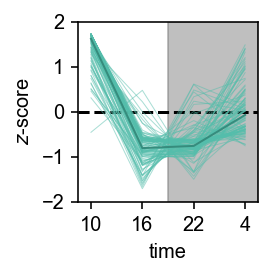

In [52]:
fig, ax = plt.subplots(figsize=(2,2))

rect = mpatches.Rectangle(xy=(1.5, -2), width=1.75, height=4, color='grey', alpha=0.5)
ax.add_patch(rect)
ax.set_xlim(-0.25,3.25)
ax.set_ylim(-2,2)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels([10,16,22,4])

subset = w_X[w_X["WGCNA_ww"]==1][[0,1,2,3]]
for j, row in subset.iterrows():
    ax.plot(list(row[[0,1,2,3]]), lw=0.5, color=lighten_color(WGCNA_ww_cmap[1], 1.5), alpha=0.5)

ax.hlines(y=0, xmin=-0.25, xmax=3.25, linestyle="--")
ax.plot(subset.describe().T["50%"], lw=1, color=lighten_color(WGCNA_ww_cmap[1], 2))
ax.set_xlabel("time", size=10)
ax.set_ylabel("$z$-score", size=10)

plt.tight_layout()
# plt.savefig("../Figures/Network-Analysis/P-amilis-WW1-zscore.pdf", dpi=300, bbox_to_inches="tight")

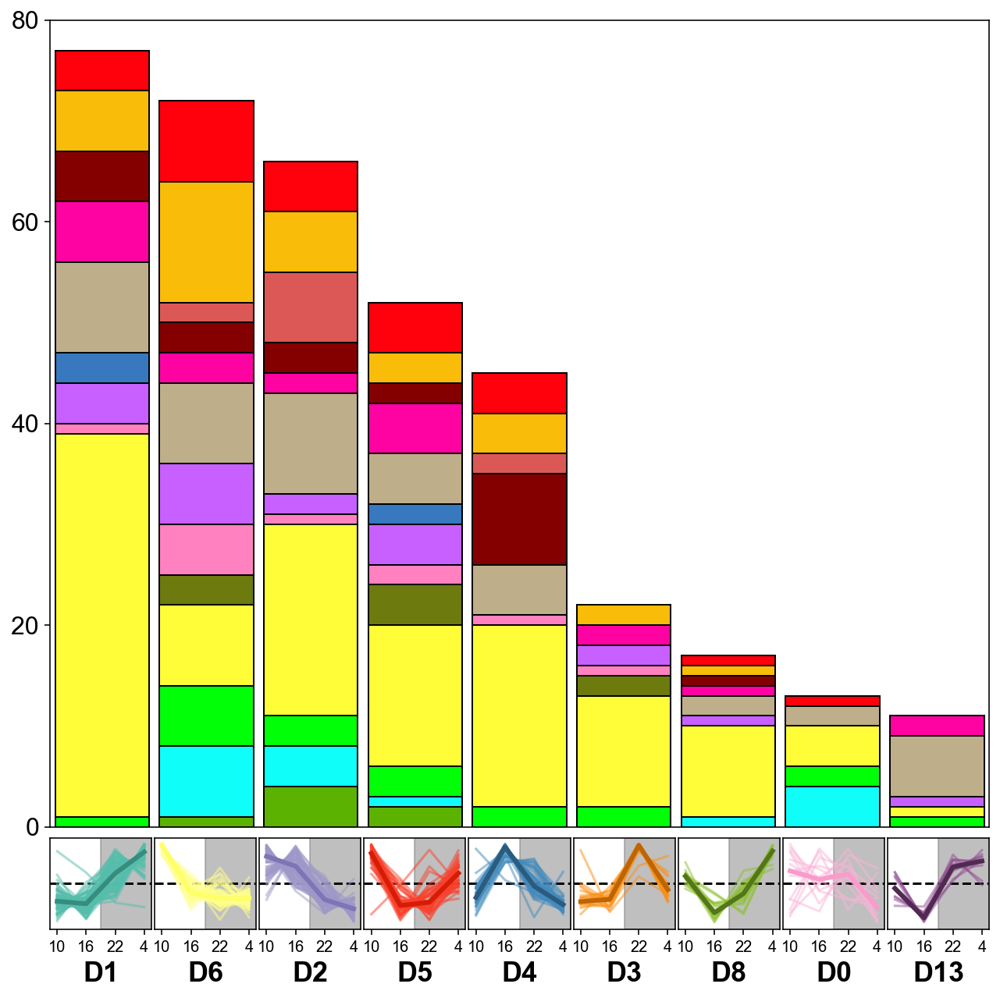

In [53]:
fig = plt.figure(constrained_layout=False, figsize=(9,9))

gs = fig.add_gridspec(nrows=9, ncols=9)
ax_d01 = fig.add_subplot(gs[8, 0])
ax_d02 = fig.add_subplot(gs[8, 1])
ax_d03 = fig.add_subplot(gs[8, 2])
ax_d04 = fig.add_subplot(gs[8, 3])
ax_d05 = fig.add_subplot(gs[8, 4])
ax_d06 = fig.add_subplot(gs[8, 5])
ax_d07 = fig.add_subplot(gs[8, 6])
ax_d08 = fig.add_subplot(gs[8, 7])
ax_d09 = fig.add_subplot(gs[8, 8])
ax_bg = fig.add_subplot(gs[0:-1, 0:])

for i, ax in enumerate(fig.get_axes()):
    ax.set_xticks([])
    ax.set_yticks([])

x=0
for i,v in pathways["WGCNA_d"].value_counts().items():
    if v>=10:
        bottom = 0
        for k,p in pathways[pathways["WGCNA_d"]==i]["Pathway"].value_counts(sort=False).sort_index().iteritems():
            ax_bg.bar(x=x, height=p, bottom=bottom, color = colormap[k], edgecolor="black", width=0.9, align="center")
            bottom+=p
        x+=1
        
handles = []
for i, (k,v) in enumerate(sorted(colormap.items(), reverse=True)):
    if k == "Circadian rhythm/Light response": k = "Circadian rhythm/\nLight response"
    handles.append(mpatches.Patch(color=v, label=k, ec="black"))
# ax_bg.legend(handles=handles, loc="upper right", frameon=False, fontsize=16, ncol=2)

ax_bg.set_yticks(np.arange(0,120,20))
ax_bg.set_yticklabels(np.arange(0,120,20), size=16)
ax_bg.set_xlim(-0.5,8.5)
ax_bg.set_ylim(0,80)

ax = fig.get_axes()
for i,(k,c) in enumerate(WGCNA_d_cmap.items()):
    if c == "xkcd:white":
        continue
    else:
        rect = mpatches.Rectangle(xy=(1.5, -2), width=1.75, height=4, color='grey', alpha=0.5)
        ax[i].add_patch(rect)
        ax[i].set_xlim(-0.25,3.25)
        ax[i].set_ylim(-2,2)
        
        ax[i].set_xticks([0,1,2,3])
        ax[i].set_xticklabels([10,16,22,4])
        
        subset = d_X[d_X["WGCNA_d"]==k][[0,1,2,3]]
        for j, row in subset.iterrows():
            ax[i].plot(list(row[[0,1,2,3]]), color=lighten_color(c, 1.5), alpha=0.5)
        
        ax[i].hlines(y=0, xmin=-0.25, xmax=3.25, linestyle="--")
        ax[i].plot(subset.describe().T["50%"], lw=3, color=lighten_color(c, 2), label="Cluster {}".format(i+1),)
        ax[i].set_xlabel("D{}".format(int(k)), size=18, weight="bold")
        
plt.tight_layout(w_pad=-0.15, h_pad=-0.2)
# plt.savefig("../Figures/Network-Analysis/P-amilis-drought-bar-profiles.pdf", format="pdf", dpi=300, bbox_to_inches="tight")

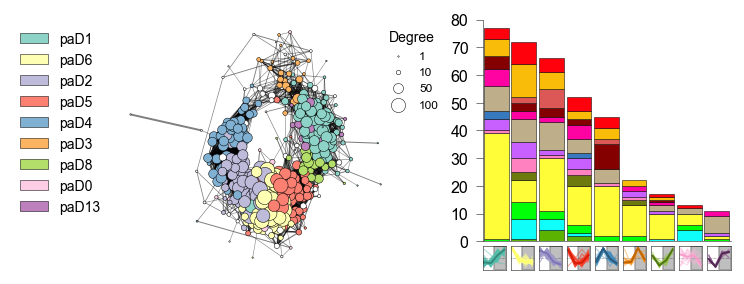

In [54]:
fig = plt.figure(constrained_layout=False, figsize=(6.75, 2.3))

gs = fig.add_gridspec(nrows=9, ncols=27)
ax_nxleg = fig.add_subplot(gs[:,0:3])
ax_nx = fig.add_subplot(gs[:,3:13])
ax_psleg = fig.add_subplot(gs[:, 13:15])
ax_d01 = fig.add_subplot(gs[8, 16])
ax_d02 = fig.add_subplot(gs[8, 17])
ax_d03 = fig.add_subplot(gs[8, 18])
ax_d04 = fig.add_subplot(gs[8, 19])
ax_d05 = fig.add_subplot(gs[8, 20])
ax_d06 = fig.add_subplot(gs[8, 21])
ax_d07 = fig.add_subplot(gs[8, 22])
ax_d08 = fig.add_subplot(gs[8, 23])
ax_d09 = fig.add_subplot(gs[8, 24])
ax_bg = fig.add_subplot(gs[:-1, 16:25])

for i, ax in enumerate(fig.get_axes()):
    ax.set_xticks([])
    ax.set_yticks([])
    
# Module color legend
handles = []
for i, (k,v) in enumerate(WGCNA_d_cmap.items()):
    if v == "xkcd:white": continue
    handles.append(mpatches.Patch(color=v, label="paD{}".format(int(k)), ec="black", linewidth=0.25))
ax_nxleg.legend(handles=handles, loc="upper right", frameon=False, fontsize=7, ncol=1)
ax_nxleg.axis('off')

# Point size legend
l1 = ax_psleg.scatter([],[], s=0.5*1, c="white", edgecolors='black', label="1", linewidth=0.25)
l2 = ax_psleg.scatter([],[], s=0.5*10, c="white", edgecolors='black', label="10", linewidth=0.25)
l3 = ax_psleg.scatter([],[], s=0.5*50, c="white", edgecolors='black', label="50", linewidth=0.25)
l4 = ax_psleg.scatter([],[], s=0.5*100, c="white", edgecolors='black', label="100", linewidth=0.25)
ax_psleg.legend(title="Degree", fontsize="6", frameon=False, title_fontsize=7)
ax_psleg.axis("off")

# Network plot
pos = nx.kamada_kawai_layout(dG)
WGCNA_d_cmap = {}
for idx, (i,v) in enumerate(pathways["WGCNA_d"].value_counts().items()):
    if idx == 8: idx+=1
    if v>=10: color = plt.cm.Set3(idx)
    else: color = "xkcd:white"
    WGCNA_d_cmap[i] = color   
nodecolors = [WGCNA_d_cmap[pathways[pathways["genemodel"]==n]["WGCNA_d"].values[0]] for n in dNodes]
ec = nx.draw_networkx_edges(dG, pos, alpha=0.5, width=[dG[u][v]['weight'] for u,v in dG.edges()], ax=ax_nx)
nc = nx.draw_networkx_nodes(dG, pos, nodelist = dNodes, node_size=[v/2 for v in d_degreedict.values()], 
                            node_color = nodecolors, linewidths=0.25, ax=ax_nx)
nc.set_edgecolor('black')
ax_nx.axis('off')

# Bar plot
x=0
for i,v in pathways["WGCNA_d"].value_counts().items():
    if v>=10:
        bottom = 0
        for k,p in pathways[pathways["WGCNA_d"]==i]["Pathway"].value_counts(sort=False).sort_index().iteritems():
            ax_bg.bar(x=x, height=p, bottom=bottom, color = colormap[k], edgecolor="black", 
                      width=0.9, align="center", linewidth=0.25)
            bottom+=p
        x+=1
ax_bg.tick_params(axis="y", which='both', width=0.25)
ax_bg.set_yticks(np.arange(0,100,10))
ax_bg.set_yticklabels(np.arange(0,100,10), size=8)
ax_bg.set_xlim(-0.5,8.5)
ax_bg.set_ylim(0,80)
for a in ['bottom','left']: ax_bg.spines[a].set_linewidth(0.25)
for a in ['top','right']: ax_bg.spines[a].set_linewidth(0)

# Z-score plots
for ax,(k,c) in zip([ax_d01,ax_d02,ax_d03,ax_d04,ax_d05,ax_d06,ax_d07,ax_d08,ax_d09],WGCNA_d_cmap.items()):
    if c == "xkcd:white":
        continue
    else:
        rect = mpatches.Rectangle(xy=(1.5, -2), width=1.75, height=4, color='grey', alpha=0.5)
        ax.add_patch(rect)
        ax.set_xlim(-0.25,3.25)
        ax.set_ylim(-2,2)
        
        ax.tick_params(axis="x", which='both', length=0, width=0)
        ax.set_xticks([0,1,2,3])
        ax.set_xticklabels([])
        
        for a in ['top','bottom','left','right']: ax.spines[a].set_linewidth(0.25)
        
        subset = d_X[d_X["WGCNA_d"]==k][[0,1,2,3]]
        for j, row in subset.iterrows():
            ax.plot(list(row[[0,1,2,3]]), color=lighten_color(c, 1.5), alpha=0.5, linewidth=0.5)
        
        ax.hlines(y=0, xmin=-0.25, xmax=3.25, linestyle="dotted", linewidths=0.25)
        ax.plot(subset.describe().T["50%"], lw=1, color=lighten_color(c, 2))
        
# plt.savefig("../Figures/Network-Analysis/P-amilis-D-Fig3-panel.pdf", dpi=300, bbox_to_inches="tight")

## Creating submission files
These csvs need to have all of the pathway data, along with module assignment and orthogroup

In [55]:
suppPathways = pd.read_csv("../InDepth-Annotation-Pipeline/P-amilis-pathway-assignments.csv")
sleuthDE = pd.read_csv("../Abundance-analysis/sleuth/P-amilis-sleuth-DEgenes.csv")
suppPathways = suppPathways.merge(sleuthDE[["target_id", "qval"]], left_on="genemodel", right_on="target_id", how='left').drop(labels=["target_id"], axis=1)
suppPathways = suppPathways.merge(wwModAssgn, on="genemodel", how="left")
suppPathways = suppPathways.drop(labels=["Notes"], axis=1)
to_replace = ["Circadian rhythm", "Circadian rhythm/Light response", "Light response"]
suppPathways["Pathway"] = [p if p not in to_replace else "Circadian/Light response" for p in suppPathways.Pathway.values]
suppPathways

,Orthogroup,Arabidopsis ortholog,genemodel,Uniprot,Gene-family,Block-description,Pathway,Localization,qval,WGCNA_ww,WGCNA_d
0,OG0002519,"AT5G50370, AT5G63400",FUN_011473,ADK3-2,ADK,Adenylate kinase 3,PEP generation,chloroplast,0.026105,2.0,13.0
1,OG0006840,AT5G35170,FUN_026031,ADK5-1,ADK,Adenylate kinase 5,PEP generation,chloroplast,0.000181,3.0,2.0
2,OG0002519,"AT5G50370, AT5G63400",FUN_046898,ADK3-1,ADK,Adenylate kinase 3,PEP generation,chloroplast,0.154056,1.0,6.0
3,OG0011322,AT5G47840,FUN_048323,ADK2-1,ADK,Adenylate kinase 2,PEP generation,chloroplast,0.152209,3.0,5.0
4,OG0005172,"AT2G18915,AT5G57360",FUN_013066,ADO1-1,ADO/ZTL,Adagio/Zeitlupe 1,Circadian/Light response,NaN,0.049064,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...
511,OG0002359,"AT2G21410, AT4G39080",FUN_050612,VHA-a2-3,VHA,V-type proton ATPase catalytic subunit a2,Proton transport,vacuole,0.026534,2.0,13.0
512,OG0000819,"AT4G38920, AT1G19910, AT2G16510, AT4G34720",FUN_050746,VHA-c-4,VHA,V-type proton ATPase catalytic subunit c,Proton transport,vacuole,0.023234,1.0,5.0
513,OG0006235,AT4G02620,FUN_050845,VHA-F-1,VHA,V-type proton ATPase catalytic subunit F,Proton transport,vacuole,0.000002,1.0,8.0
514,OG0005190,AT3G42050,FUN_052554,VHA-H-2,VHA,V-type proton ATPase catalytic subunit H,Proton transport,vacuole,0.000013,3.0,5.0
